
---



---


### **REGRESSION PROJECT ON PREDICTING LIFE EXPECTANCY USING WHO DATASET**
##### **ASSIGNMENT - 1 :  ML CLEANING AND FEATURE SELECTION**


---

<a target="_blank" href="https://githubtocolab.com/ShreyaJaiswal1604/Coursework-Data-Science-Engineering-Methods/blob/main/ML%20Data%20Cleaning%20and%20Feature%20Selection/Life_Expectancy_Regression_ML.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>

---


> **ABOUT THE DATASET**


---



> The Global Health Observatory (GHO) data repository under World Health Organization (WHO) keeps track of the health status and other factors related to health for all countries. The dataset is made avalailable to the public for the purpose of performing health data analaysis. The data-set related to life expectancy, health factors for 193 countries has been collected from the WHO data repository website and its corresponding economic data was collected from United Nation website.


>dataset origin : https://www.kaggle.com/kumarajarshi/life-expectancy-who



---


> **PROJECT OVERVIEW**


---



> The project aims to perform Exploratory Data Analysis (EDA) on the WHO dataset and implement linear regression model to predict the Life Expectancy.



> The following process has been implemented in the project
1.   **ABOUT THE DATASET**
      1. Life Expectancy

> 2.  **IMPORT LIBRARIES**

> 3. **READ THE DATA**

> 4. **CLEANING THE DATA COLUMNS NAMES**

> 5. **EXPLORATORY DATA ANALYSIS (EDA)**
      1. Distribution of Life Expectancy
      2. Correlation Heatmap for dependency Visualization
      3. HeatMap
      4. Correlation Matrix
      5. Plotting Life Expectance vs Adult Mortality for developed and developing countries
      6. Plotting Life Expectance vs GDP for developed and developing countries
      7. Plotting Life Expectance vs Schooling using hex plot
      8. Plotting Life Expectance vs income composition of resources for developed and developing countries using KDE plot
       

> 6. **DATA PREPROCESSING**
      1. DATA PREPROCESSING
      2. IMPUTATION
      3. Performing Imputation by filling the null values of the feature with the corresponding median obtained over the years
      4. HANDLING OUTLIERS
      5. ENCODING THE CATEGORICAL DATA

> 7. **FEATURE ENGINEERING**
      1. Q-Q PLOT
      2. HISTOGRAM PLOT
      3. PERFORMING NORMALIZATION USING ROBUSTSCALAR
      
> 8. **IDENTIFYING PREDICTOR SIGNIFICANCE OR FEATURE SELECTION**


 

>9. **BUILDING THE MODEL**
      1. Train,Test Split
      2. Comparing trainig data and testing data
      3. Linear Regression model
      4. Predicting with test data
      5. Evaluating the model using metric

>10. **UNDERSTANDING THE IMPORTANT FEATURES**
>11. **PERMUTATION MODEL**
>12. **Answer the following questions:**



---





























### **LIFE EXPECTANCY**


> Life Expectancy is the statistical measure of the average time a person is expected to live based on a variety of factors such as age, sex, health, demographic factors etc.



> The **WHO** Dataset consists **2938** rows and **22** columns 


> The columns are as followed 
  1. **COUNTRY** : Country name

> 2.  **YEAR**: Year ranges from 2000 - 2015

> 3. **LIFE EXPECTANCY :** Life Expectancy in age

> 4. **ADULT MORTALITY :** Probability of dying between 15-60 years per 1000 population

>  5. **INFANT DEATHS :** Number of infant deaths per 1000 population

>  6. **ALCOHOL :** Recorded per capita consumption in litres

>  7. **PERCENTAGE :**  Recorded as percentage of Gross Product per capita(%)

>  8. **HEPATITIS B:** Immunization coverage among 1 year old

>  9. **MEASLES :** Number of cases reported per 1000 population in percentage (%)

> 10. **BMI :** Average Body Mass Index of the population

> 11. **UNDER-FIVE-DEATHS:** Number of under five deaths per 1000 population

> 12. **POLIO :** Immunization coverage among 1 year old in percentage (%)

> 13. **TOTAL EXPENDITURE :** Government expenditure on heath as a percentage of total government expenditure

> 14. **DIPTHERIA :** DPT Immunization among the 1 year old in percentage (%)

> 15. **HIV/AIDS :** Deaths per 1000 live births

> 16. **POPULATION :** Population of the country

> 17. **THINNESS 1-19 YEARS:** Prevalence of thinness among children and adolescents for Age 10 to 19 (%)

> 18. **INCOME COMPOSITION OF RESOURCES:** Human Development Index based on income and availability of resources. Ranges between 0 and 1

> 19. **THINNESS 5-9 YEARS :** Prevalence of thinness among children and adolescents for Age 5 to 9 (%)

> 20. **SCHOOLING :** Number of years of Schooling in years

> 21. **GDP :** Gross Domestic Product per vcapita ( in USD)


> 22. **STATUS** : Developed or Developing Country


---

*   There are only 2 **CATEGORICAL** variables : **COUNTRY, STATUS**
*   All other column values are **NUMERIC** VARIABLES

---


In [1]:

# !pip install Jinja2==3.0.0
# !pip install eli5==0.12.0

####**IMPORT LIBRARIES**

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from google.colab import files
from scipy.stats.mstats import winsorize
from statsmodels.graphics.gofplots import qqplot
from sklearn.preprocessing import normalize, RobustScaler
import io
from sklearn.model_selection import train_test_split

from sklearn.feature_selection import f_regression
import pandas as pd
import statsmodels.api as sm
from pandas.testing import assert_frame_equal

from sklearn.model_selection import train_test_split

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn import datasets, linear_model

from sklearn import metrics
import eli5
from eli5.sklearn import PermutationImportance

from sklearn.impute import SimpleImputer
import statistics 

from jinja2.filters import do_default


####**FUNCTIONS**

> Function defined to clean column names

In [3]:
def cleanColumnNames(df):
  #remove trailing and leading spaces
  df=df.rename(columns=lambda x :  x.strip())

  #remove extra spaces 
  df.columns = df.columns.str.replace('  ',' ')

  #replace space with underscore
  df.columns=df.columns.str.replace(' ','_')

  #lowercase the column names
  df = df.rename(columns=lambda x: x.lower())
  
  return df




> Function defined to obtain the null information the columns of a dataframe




In [4]:
#Find null stats

def null_information(df):
  df_columns = list(df.columns)

  for colname in df_columns:
    null_rows = df[colname].isnull().sum()
    total_rows = df[colname].count()
    percentage_nulls = round((null_rows/total_rows)*100,2)
    # print("\ncolumn name --> ", colname)
    # print( "null rows --> ", null_rows)
    # print( "total row count --> ", total_rows)
    # print( "percentage of null rows --> ", percentage_nulls,"")
    print(f"column : {colname} has {null_rows} null values ---> {percentage_nulls} % of nulls ")


#### **READ THE DATA**

In [5]:
url = 'https://raw.githubusercontent.com/ShreyaJaiswal1604/Coursework-Data-Science-Engineering-Methods/main/ML%20Data%20Cleaning%20and%20Feature%20Selection/Life%20Expectancy%20Data.csv'

In [6]:
df_original = pd.read_csv(url)

In [7]:
df_original.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [8]:
# uploaded = files.upload()

In [9]:
#read the csv file
# df_original = pd.read_csv(io.BytesIO(uploaded['Life Expectancy Data.csv']))
# df_original.head()

####**CLEANING THE DATA COLUMNS NAMES**

In [10]:
#Using the cleanColumnName function to clean the column names
df_original = cleanColumnNames(df_original)
df_original.head()

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,...,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [11]:
#Displays statistical information of the numeric columns
df_original.describe()

,year,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,bmi,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [12]:
#Provides Column details
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          2938 non-null   object 
 1   year                             2938 non-null   int64  
 2   status                           2938 non-null   object 
 3   life_expectancy                  2928 non-null   float64
 4   adult_mortality                  2928 non-null   float64
 5   infant_deaths                    2938 non-null   int64  
 6   alcohol                          2744 non-null   float64
 7   percentage_expenditure           2938 non-null   float64
 8   hepatitis_b                      2385 non-null   float64
 9   measles                          2938 non-null   int64  
 10  bmi                              2904 non-null   float64
 11  under-five_deaths                2938 non-null   int64  
 12  polio               

**EXPLORATORY DATA ANALYSIS (EDA)** 




> Using Exploratory Data Analysis (EDA), we can analyze and investigate the data sets and summarize the required characteristics mainly through visualizations.

> PYTHON LIBRARIES USED:
1. Seaborn
2. Matplotlib
3. Plotly



---














 **Distribution of Life Expectancy**

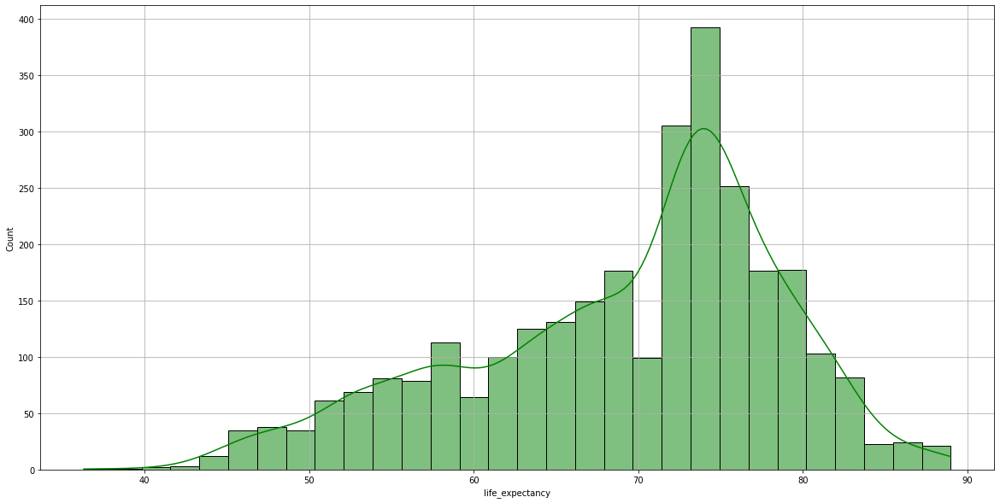

In [13]:

plt.figure(figsize=(20,10))
sns.histplot(df_original['life_expectancy'].dropna(), kde=True, color="green")
plt.grid(True)

**Correlation Heatmap for dependency Visualization**


**HEATMAP**


> A correlation heatmap is a heatmap that shows a 2D correlation matrix between two discrete dimensions, using colored cells to represent data from usually a monochromatic scale



*  The parameter cmap can takes various existing color mapping such as 
    1. mako
    2. coolwarm
    3. YlGnBu
    4. Spectral
    5. crest

*  You can define your own cmap palette as well

  **REFERENCE**

 https://seaborn.pydata.org/generated/seaborn.heatmap.html
 https://seaborn.pydata.org/examples/many_pairwise_correlations.html


**CORRELATION MATRIX**



  1. Correlation defines  how two or more variables are related to one another.
  2. Correlation matrix is a table which displays the coefficients for the variables present in the table. It defines the extent of interdependency between the variables.
  3. **-1** defines a prefectly negative correlation between the variables
  4. **0** defines no correlation between the variables
  5. **1** defines a perfectly positive correlation between the variables

   **REFERENCES**

   https://www.statology.org/how-to-read-a-correlation-matrix/
   https://muthu.co/understanding-correlations-and-correlation-matrix/
   https://www.wallstreetmojo.com/correlation-matrix/#h-what-is-the-correlation-matrix








> 













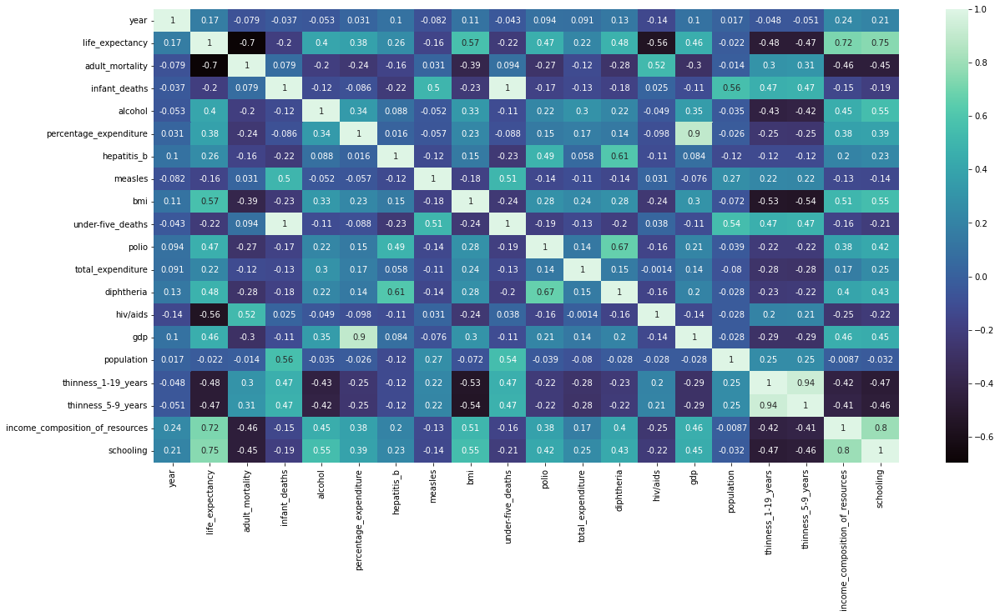

In [14]:
#PLOTTING THE HEATMAP
plt.figure(figsize=(20,10))
sns.heatmap(df_original.corr(), annot=True, cmap="mako")

**INFERENCE**


---



Insights obtained from the correlation matrix


1. Correlation value between Life Expectancy and Adult Mortality relate is **-0.7**.Therefore a high negative correlation is anticipated between them.
2. Correlation value between GDP and Life Expectancy is **0.46**. It exhibits a positive correlation, which can be inferred  that as the GDP inceases, the life expectancy also increases.
3. BMI also has a positive correlation of **0.57**.
4. Schooling years also have positive correlation with Life Expectancy, with  the value of **0.75**
5. Income composition of resources also exhibits a high correlation with Life Expectancy of **0.72**. Which can be inferred as more the income and availability of resources leads to high Life Expectancy.



---



**Plotting Life Expectance vs Adult Mortality for developed and developing countries**







<Figure size 1440x720 with 0 Axes>

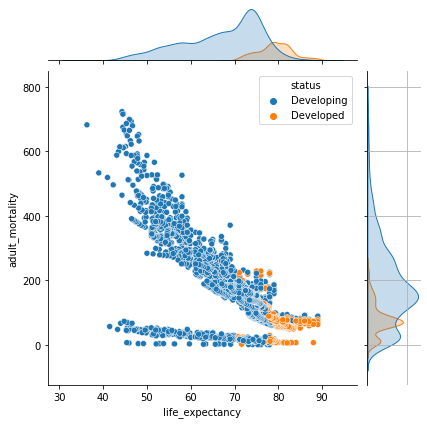

In [15]:
plt.figure(figsize=(20,10))
sns.jointplot(data=df_original, y=df_original['adult_mortality'], x=df_original['life_expectancy'], hue=df_original['status'])
plt.grid(True)

**INFERENCE**


---

We see that the developed countries have low adult mortality which leads to high life expectancy

**Plotting Life Expectance vs GDP for developed and developing countries**

<Figure size 1440x720 with 0 Axes>

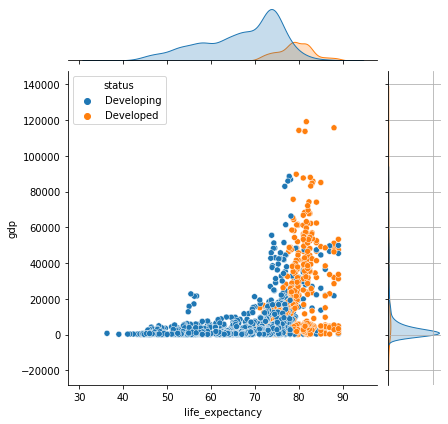

In [16]:
plt.figure(figsize=(20,10))
sns.jointplot(data=df_original, y=df_original['gdp'], x=df_original['life_expectancy'],hue=df_original['status'] )
plt.grid(True)

**INFERENCE**


---

We see that most of the developed countries have a high GDP leading to a higher life expectancy when compared to the developing countries

---




**Plotting Life Expectance vs Schooling using hex plot**


> hex plot represents a 2D histogram plot, in which the bins are hexagons and the color represents the number of data points within each bin. 



<Figure size 1440x720 with 0 Axes>

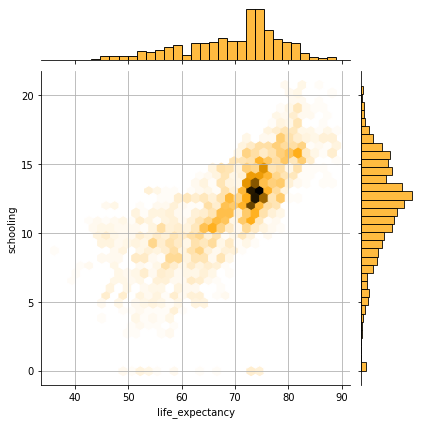

In [17]:
plt.figure(figsize=(20,10))
sns.jointplot(data=df_original, y=df_original['schooling'], x=df_original['life_expectancy'],kind='hex',color='orange')
plt.grid(True)

**INFERENCE**


---

As the year of schooling increases it is observed that the life expectancy also increases.


---



**Plotting Life Expectance vs income composition of resources for developed and developing countries using KDE plot**



> A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset, analogous to a histogram.



<Figure size 1440x720 with 0 Axes>

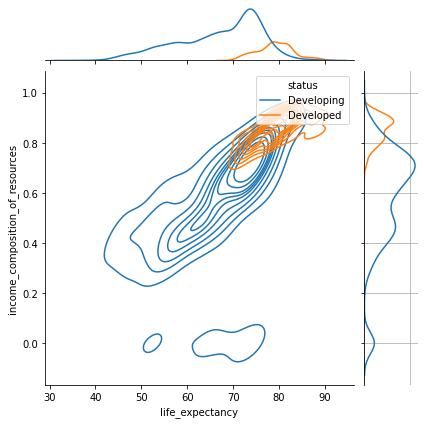

In [18]:
plt.figure(figsize=(20,10))
sns.jointplot(data=df_original, y=df_original['income_composition_of_resources'], x=df_original['life_expectancy'], kind='kde', hue=df_original['status'])
plt.grid(True)

**INFERENCE**


---

We see that the devloped countries have a range towards the high values of both income composition of resources and life expectancy. This means that developed countries have more income and avaliability of resources which leads to a higher life expectancy.


---



**PAIR PLOTS**


> The Seaborn Pairplot allows us to plot pairwise relationships between variables within a dataset.


> https://seaborn.pydata.org/generated/seaborn.pairplot.html






<Figure size 1440x720 with 0 Axes>

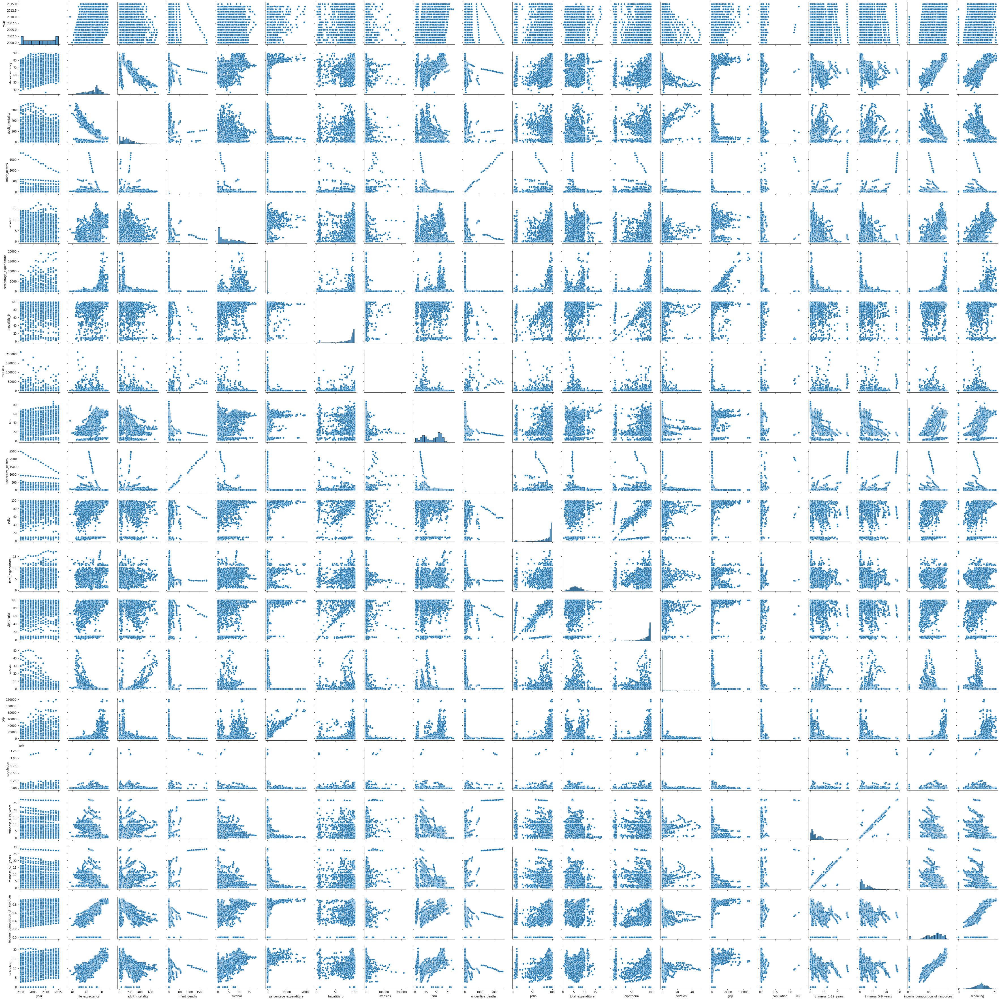

In [19]:
plt.figure(figsize=(20,10))
sns.pairplot(df_original, palette=sns.color_palette("pastel"))
plt.grid(True)

### **DATA PREPROCESSING**
  
*   Data preprocessing is a data mining technique which transforms the data into an understandable format.

*   Real-world data are not likely to be consistent and may have a lot of variations. It is therefore important to pre process the data before implementing any modeling technique to get a better and more accurate result.



**CHECK THE NULL VALUES**

In [20]:
#checking null values
df_original.isnull().sum()

country                              0
year                                 0
status                               0
life_expectancy                     10
adult_mortality                     10
infant_deaths                        0
alcohol                            194
percentage_expenditure               0
hepatitis_b                        553
measles                              0
bmi                                 34
under-five_deaths                    0
polio                               19
total_expenditure                  226
diphtheria                          19
hiv/aids                             0
gdp                                448
population                         652
thinness_1-19_years                 34
thinness_5-9_years                  34
income_composition_of_resources    167
schooling                          163
dtype: int64

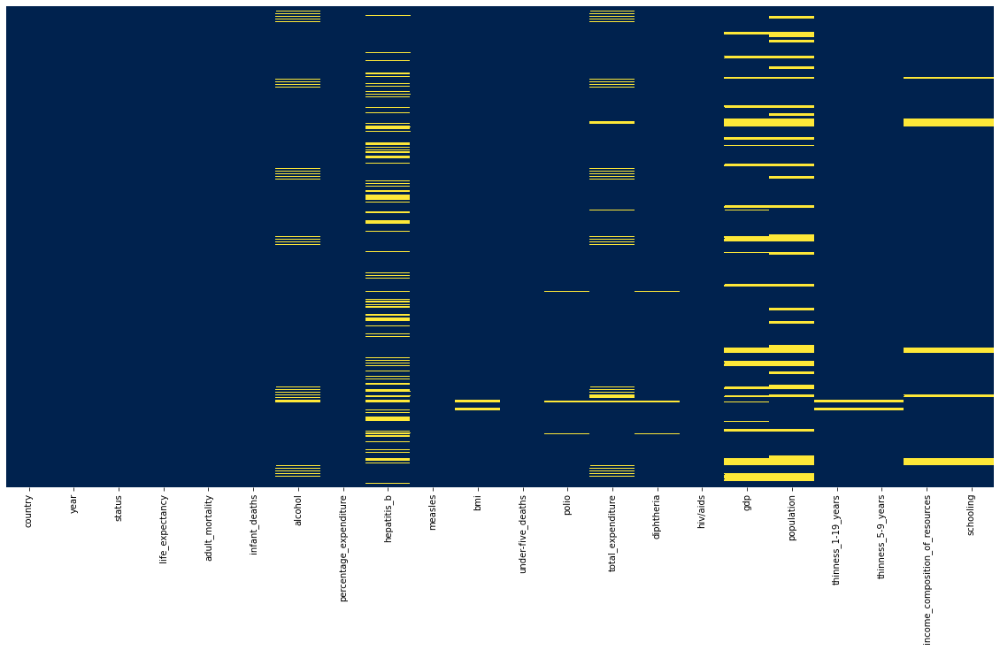

In [21]:
#plotting heatmap to check the null values
plt.figure(figsize=(20,10))
sns.heatmap(df_original.isnull(),yticklabels=False,cbar=False,cmap='cividis')

In [22]:
#getting null information
null_information(df_original)

column : country has 0 null values ---> 0.0 % of nulls 
column : year has 0 null values ---> 0.0 % of nulls 
column : status has 0 null values ---> 0.0 % of nulls 
column : life_expectancy has 10 null values ---> 0.34 % of nulls 
column : adult_mortality has 10 null values ---> 0.34 % of nulls 
column : infant_deaths has 0 null values ---> 0.0 % of nulls 
column : alcohol has 194 null values ---> 7.07 % of nulls 
column : percentage_expenditure has 0 null values ---> 0.0 % of nulls 
column : hepatitis_b has 553 null values ---> 23.19 % of nulls 
column : measles has 0 null values ---> 0.0 % of nulls 
column : bmi has 34 null values ---> 1.17 % of nulls 
column : under-five_deaths has 0 null values ---> 0.0 % of nulls 
column : polio has 19 null values ---> 0.65 % of nulls 
column : total_expenditure has 226 null values ---> 8.33 % of nulls 
column : diphtheria has 19 null values ---> 0.65 % of nulls 
column : hiv/aids has 0 null values ---> 0.0 % of nulls 
column : gdp has 448 null val

**INFERENCE**


---




> From the above values, we can see that the following columns have null values
1.   life_expectancy
2.   adult_mortality
3.   alcohol
4.   hepatatis_b
5.   bmi
6.   polio
7.   total_expenditure
8.   diptheria
9.   gdp
10.  population
11.  thinness_1-19_years
12.  thinness_5-9_years
13.  income_composition_of_resources
14.  schooling




> There are many columns which have null values, however, the number of records are not large enough to drop the data. Dropping the data would further lead to the loss of some important information and degrade our model.



> Therefore, Imputation of these missing values would be a better option.










**IMPUTATION**

---


> Data imputation is a method for retaining the majority of the dataset's data and information by substituting missing data with a different value.
https://towardsdatascience.com/6-different-ways-to-compensate-for-missing-values-data-imputation-with-examples-6022d9ca0779




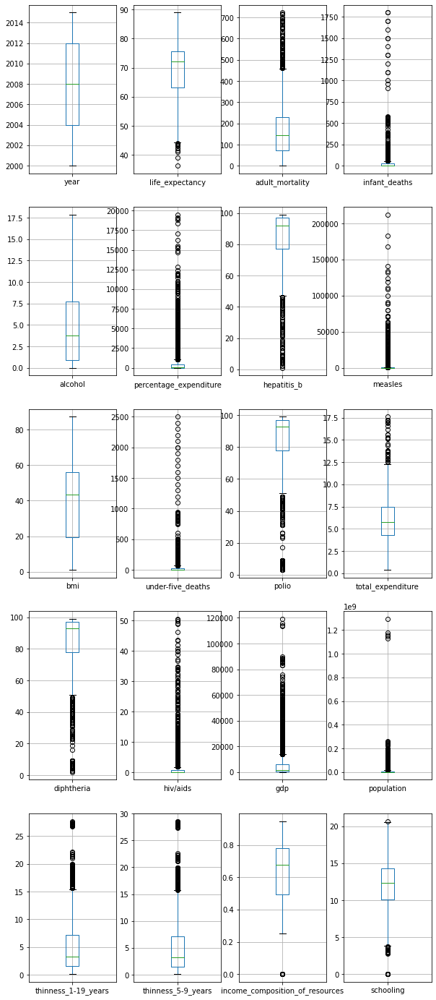

In [23]:
#Analysing the numeric variables through boxplot to obtain appropriate imputaion value

df_impute = df_original.copy()
df_impute.drop(['status','country'], axis=1, inplace=True)
plt.figure(figsize=(10,30))

for i, column in enumerate(list(df_impute.columns), start=1):
  plt.subplot(6,4,i)
  df_impute.boxplot(column)

**INFERENCE**


---


*   In statistics, an **outlier** is a data point that differs significantly from other observations.

*   As we can see from the above plots, most of the variables have outliers.

*   Imputing the missing values will central average (mean) would therefore not be a good idea.

*   Therefore, I would fill the values with the median of the numeric variables/features.

*   We will be handling **outliers** later in this notebook

---




















**Performing Imputation by filling the null values of the feature with the corresponding median obtained over the years**

In [24]:
#IMPUTATION
df_original_impt = df_original.copy()
#df_original_impt.info()
#df_original_impt.reset_index(inplace=True)
df_original_impt.groupby('country').apply(lambda group: group.interpolate(method= 'linear'))
df_original_impt
data_imputed=[]
numeric_columns = list(df_impute.columns)
for year in list(df_original_impt.year.unique()):
  #print(f"year ==> {year}")
  year_data = df_original_impt[df_original_impt.year == year].copy()
  #display(year_data)

  for column in numeric_columns:
    #print("inside null col", column)
    year_data[column] = year_data[column].fillna(year_data[column].dropna().median()).copy()
  data_imputed.append(year_data)
df_original_impt = pd.concat(data_imputed).copy()

display(df_original_impt)

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,...,polio,total_expenditure,diphtheria,hiv/aids,gdp,population,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.010,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
16,Albania,2015,Developing,77.8,74.0,0,4.600,364.975229,99.0,0,...,99.0,6.00,99.0,0.1,3954.227830,28873.0,1.2,1.3,0.762,14.2
32,Algeria,2015,Developing,75.6,19.0,21,5.285,0.000000,95.0,63,...,95.0,7.08,95.0,0.1,4132.762920,39871528.0,6.0,5.8,0.743,14.4
48,Angola,2015,Developing,52.4,335.0,66,5.285,0.000000,64.0,118,...,7.0,7.08,64.0,1.9,3695.793748,2785935.0,8.3,8.2,0.531,11.4
64,Antigua and Barbuda,2015,Developing,76.4,13.0,0,5.285,0.000000,99.0,0,...,86.0,7.08,99.0,0.2,13566.954100,2076086.0,3.3,3.3,0.784,13.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2873,Venezuela (Bolivarian Republic of),2000,Developing,72.5,168.0,11,8.010,0.000000,5.0,22,...,86.0,4.91,77.0,0.1,828.989862,1243229.0,1.8,1.7,0.670,10.6
2889,Viet Nam,2000,Developing,73.4,139.0,33,1.600,0.000000,89.0,16512,...,96.0,4.89,96.0,0.1,828.989862,1243229.0,15.8,16.4,0.569,10.4
2905,Yemen,2000,Developing,68.0,252.0,48,0.070,0.000000,14.0,0,...,74.0,4.14,74.0,0.1,828.989862,1243229.0,14.1,14.1,0.436,7.7
2921,Zambia,2000,Developing,43.8,614.0,44,2.620,45.616880,89.0,30930,...,85.0,7.16,85.0,18.7,341.955625,1531221.0,7.5,7.5,0.418,9.6


In [25]:
#getting null information after imputation
null_information(df_original_impt)

column : country has 0 null values ---> 0.0 % of nulls 
column : year has 0 null values ---> 0.0 % of nulls 
column : status has 0 null values ---> 0.0 % of nulls 
column : life_expectancy has 0 null values ---> 0.0 % of nulls 
column : adult_mortality has 0 null values ---> 0.0 % of nulls 
column : infant_deaths has 0 null values ---> 0.0 % of nulls 
column : alcohol has 0 null values ---> 0.0 % of nulls 
column : percentage_expenditure has 0 null values ---> 0.0 % of nulls 
column : hepatitis_b has 0 null values ---> 0.0 % of nulls 
column : measles has 0 null values ---> 0.0 % of nulls 
column : bmi has 0 null values ---> 0.0 % of nulls 
column : under-five_deaths has 0 null values ---> 0.0 % of nulls 
column : polio has 0 null values ---> 0.0 % of nulls 
column : total_expenditure has 0 null values ---> 0.0 % of nulls 
column : diphtheria has 0 null values ---> 0.0 % of nulls 
column : hiv/aids has 0 null values ---> 0.0 % of nulls 
column : gdp has 0 null values ---> 0.0 % of null

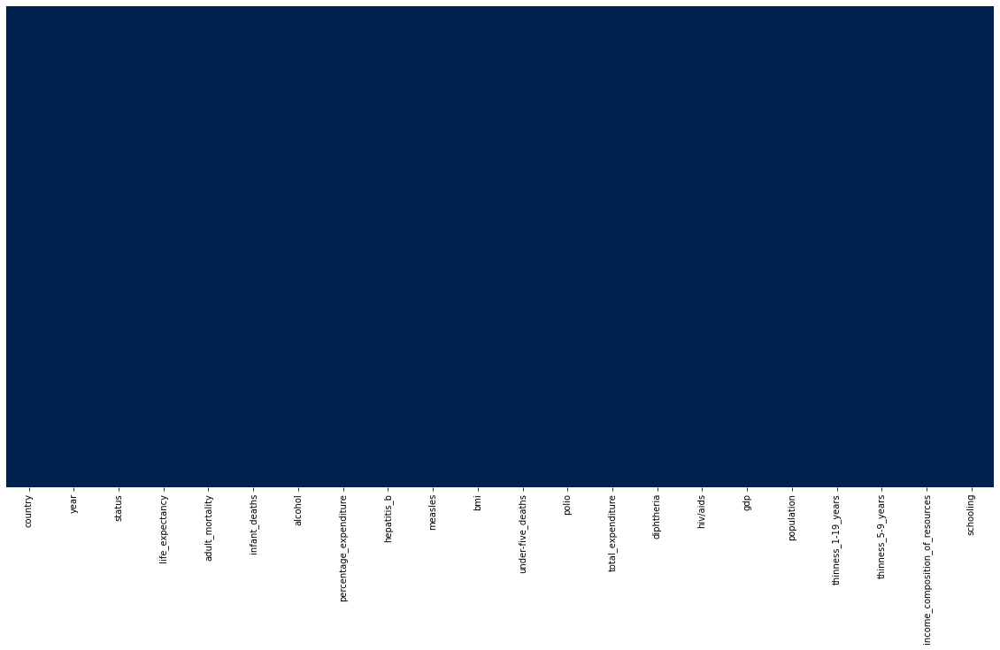

In [26]:
#plotting heatmap to check the null values after imputation
plt.figure(figsize=(20,10))
sns.heatmap(df_original_impt.isnull(),yticklabels=False,cbar=False,cmap='cividis')

**INFERENCE**


---
From the above result we see that after performing imputation there are no more null values present in our dataset.

---



**HANDLING OUTLIERS**

---


> Outliers are extreme values that stand out greatly from the overall pattern of values in a dataset or graph


> Presence of outliers can hamper our model and statistical analysis from getting the true value as they might distort the result due to their extreme values
https://statisticsbyjim.com/basics/outliers/




> https://www.statisticshowto.com/statistics-basics/find-outliers/



> https://www.pluralsight.com/guides/cleaning-up-data-from-outliers












Analysing the variables/features through boxplot to visualize the outliers in our dataset


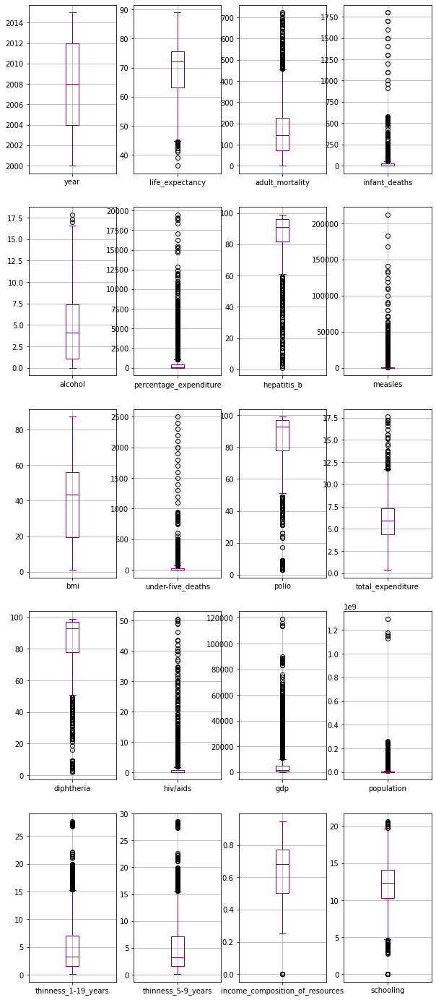

In [27]:
#Analysing the variables/features through boxplot to visualize the outliers in our dataset

df_outlier_original = df_original_impt.copy()
plt.figure(figsize=(10,30))
numeric_columns = list(df_outlier_original.columns)
numeric_columns.remove("country")
numeric_columns.remove("status")

for i, column in enumerate((numeric_columns), start=1):
  plt.subplot(6,4,i)
  df_outlier_original.boxplot(column, color="purple")

**INFERENCE**


---
From the above boxplot we infer the following 


*   Infant_deaths represents deaths per 1000. Therefore, the data points in the form of outliers which are beyond 1000 don't make sense and are unrealistic. Therefore we will remove those values. Similar analysis is seen for measles, under-five_deaths.

*  Many countries spend less than 2500% of their GDP on health. Since GDp is a crucial information which is also used to obtain other info, we will subdtitute the logarithmic value to remove the outlier. 


*   In real time BMI over 40 is defined as severe obesity. Hiwever as per the dataset analysis the median of the bmi for the countries is itself 40. Therefore, we will remove this column and not consider it for our analysis.






---

In [28]:
df_outlier_original.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          2938 non-null   object 
 1   year                             2938 non-null   int64  
 2   status                           2938 non-null   object 
 3   life_expectancy                  2938 non-null   float64
 4   adult_mortality                  2938 non-null   float64
 5   infant_deaths                    2938 non-null   int64  
 6   alcohol                          2938 non-null   float64
 7   percentage_expenditure           2938 non-null   float64
 8   hepatitis_b                      2938 non-null   float64
 9   measles                          2938 non-null   int64  
 10  bmi                              2938 non-null   float64
 11  under-five_deaths                2938 non-null   int64  
 12  polio               

**Removing outliers using conditions**

In [29]:
#removing outliers

#for infant_deaths, measles, under-five_deaths'
df_outlier_original = df_outlier_original[df_outlier_original['infant_deaths']<1001]
df_outlier_original = df_outlier_original[df_outlier_original['measles'] < 1001]
df_outlier_original = df_outlier_original[df_outlier_original['under-five_deaths'] < 1001]

#dropping bmi
df_outlier_original.drop(['bmi'],axis=1, inplace=True)



**Removing outliers using log transformation**

In [30]:
#Removing outliers
df_outlier_original['log_percentage_expenditure'] = np.log(df_outlier_original['percentage_expenditure'])
df_outlier_original['log_population'] = np.log(df_outlier_original['population'])
df_outlier_original['log_gdp'] = np.log(df_outlier_original['gdp'])
df_outlier_original = df_outlier_original.replace([np.inf, -np.inf], 0)

#display(df_outlier_original)
df_outlier_original.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2413 entries, 16 to 2905
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          2413 non-null   object 
 1   year                             2413 non-null   int64  
 2   status                           2413 non-null   object 
 3   life_expectancy                  2413 non-null   float64
 4   adult_mortality                  2413 non-null   float64
 5   infant_deaths                    2413 non-null   int64  
 6   alcohol                          2413 non-null   float64
 7   percentage_expenditure           2413 non-null   float64
 8   hepatitis_b                      2413 non-null   float64
 9   measles                          2413 non-null   int64  
 10  under-five_deaths                2413 non-null   int64  
 11  polio                            2413 non-null   float64
 12  total_expenditure  

/usr/local/lib/python3.8/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


**Removing outliers using winsorization**


> The winsorization is a method that involves replacing the smallest and largest values of a data set with the observations closest to them.



> https://www.statisticshowto.com/winsorize/



In [31]:
#removing outliers

df_outlier_original['winz_life_expectancy'] = winsorize(df_outlier_original['life_expectancy'], (0.05,0))
df_outlier_original['winz_adult_mortality'] = winsorize(df_outlier_original['adult_mortality'], (0,0.04))
df_outlier_original['winz_alcohol'] = winsorize(df_outlier_original['alcohol'], (0.0,0.01))
df_outlier_original['winz_hepatitis_b'] = winsorize(df_outlier_original['hepatitis_b'], (0.20,0))
df_outlier_original['winz_polio'] = winsorize(df_outlier_original['polio'], (0.20,0))
df_outlier_original['winz_total_expenditure'] = winsorize(df_outlier_original['total_expenditure'], (0.0,0.02))
df_outlier_original['winz_diphtheria'] = winsorize(df_outlier_original['diphtheria'], (0.10,0))
df_outlier_original['winz_income_composition_of_resources'] = winsorize(df_outlier_original['income_composition_of_resources'], (0.05,0))
df_outlier_original['winz_schooling'] = winsorize(df_outlier_original['schooling'], (0.03,0.01))
df_outlier_original['winz_hiv/aids'] = winsorize(df_outlier_original['hiv/aids'], (0.0,0.2))
df_outlier_original['winz_thinness_1-19_years'] = winsorize(df_outlier_original['thinness_1-19_years'], (0,0.04))
df_outlier_original['winz_thinness_5-9_years'] = winsorize(df_outlier_original['thinness_5-9_years'], (0.0,0.04))

df_outlier_original.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2413 entries, 16 to 2905
Data columns (total 36 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   country                               2413 non-null   object 
 1   year                                  2413 non-null   int64  
 2   status                                2413 non-null   object 
 3   life_expectancy                       2413 non-null   float64
 4   adult_mortality                       2413 non-null   float64
 5   infant_deaths                         2413 non-null   int64  
 6   alcohol                               2413 non-null   float64
 7   percentage_expenditure                2413 non-null   float64
 8   hepatitis_b                           2413 non-null   float64
 9   measles                               2413 non-null   int64  
 10  under-five_deaths                     2413 non-null   int64  
 11  polio           

Analysing the variables/features through boxplot **after** the removal of outliers


In [32]:
columns = list(df_outlier_original.columns)
rem_columns = ['life_expectancy',
 'adult_mortality',
 'alcohol',
 'percentage_expenditure',
 'hepatitis_b',
 'polio',
 'total_expenditure',
 'diphtheria',
 'hiv/aids',
 'gdp',
 'population',
 'thinness_1-19_years',
 'thinness_5-9_years',
 'income_composition_of_resources',
 'schooling','country','status']

required_columns = [i for i in columns if i not in rem_columns ]
print(len(required_columns))
required_columns

19


['year',
 'infant_deaths',
 'measles',
 'under-five_deaths',
 'log_percentage_expenditure',
 'log_population',
 'log_gdp',
 'winz_life_expectancy',
 'winz_adult_mortality',
 'winz_alcohol',
 'winz_hepatitis_b',
 'winz_polio',
 'winz_total_expenditure',
 'winz_diphtheria',
 'winz_income_composition_of_resources',
 'winz_schooling',
 'winz_hiv/aids',
 'winz_thinness_1-19_years',
 'winz_thinness_5-9_years']

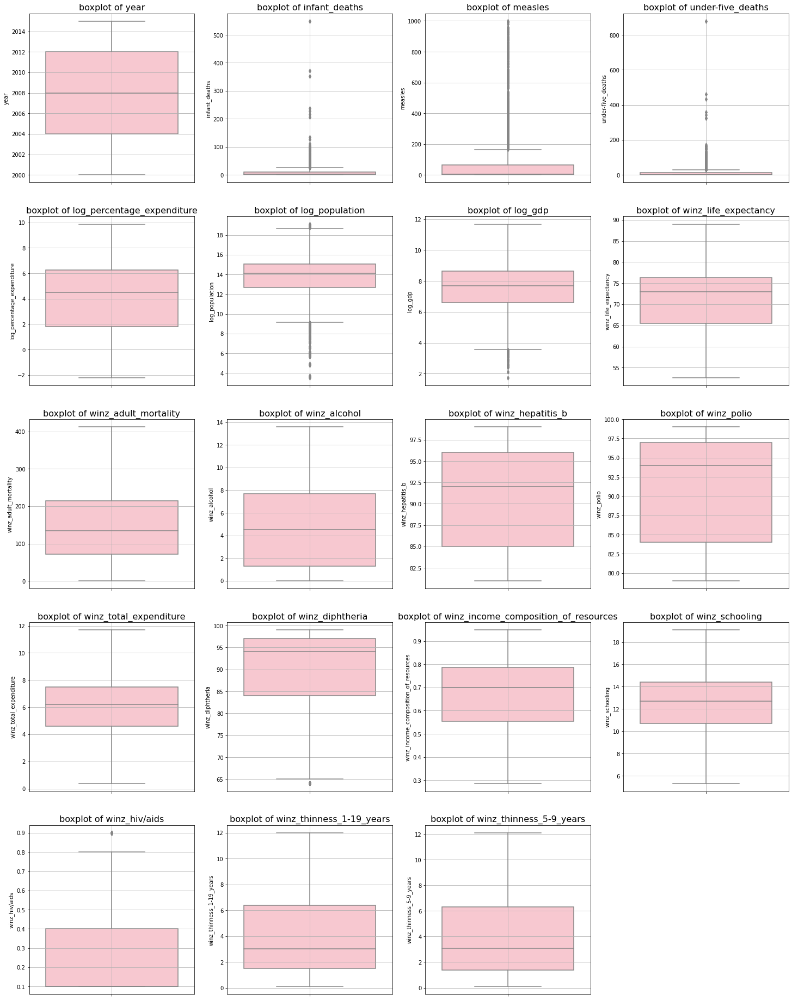

In [33]:
plt.figure(figsize=(25,40))
#sns.boxplot(data=data_norm)
i=0

for column in required_columns:
  # i+=1
  # plt.subplot(7,3,i)
  # #sns.displot(df_combined_new[column], kde=True, bins=60, color='purple')
  # plt.hist(df_outlier_original[column],color="purple")
  # plt.title(f'Histogram of {column}', fontsize=14)
  # plt.grid(True)
  
  i+=1
  plt.subplot(6,4,i)
  sns.boxplot(y=df_outlier_original[column],color="pink")
  plt.title(f'boxplot of {column}', fontsize=16)
  plt.grid(True)

plt.show()

**INFERENCE**


---
From the above boxplot we see that most of the outliers have been removed and our data looks more clean.


---



**ENCODING THE CATEGORICAL DATA**

In [34]:
df_encoder_original = df_outlier_original

status = pd.get_dummies(df_encoder_original['status'])
#status1 = pd.get_dummies(df_encoder_original['country'])
#status2 = pd.get_dummies(df_encoder_original['year'])
#.drop('Developing',axis=1)
df_encoder_original = pd.concat([df_encoder_original,status], axis=1)
#df_encoder_original = pd.concat([df_encoder_original,status1], axis=1)
#df_encoder_original = pd.concat([df_encoder_original,status2], axis=1)
display(df_encoder_original)

,country,year,status,life_expectancy,adult_mortality,infant_deaths,alcohol,percentage_expenditure,hepatitis_b,measles,...,winz_polio,winz_total_expenditure,winz_diphtheria,winz_income_composition_of_resources,winz_schooling,winz_hiv/aids,winz_thinness_1-19_years,winz_thinness_5-9_years,Developed,Developing
16,Albania,2015,Developing,77.8,74.0,0,4.600,364.975229,99.0,0,...,99.0,6.00,99.0,0.762,14.2,0.1,1.2,1.3,0,1
32,Algeria,2015,Developing,75.6,19.0,21,5.285,0.000000,95.0,63,...,95.0,7.08,95.0,0.743,14.4,0.1,6.0,5.8,0,1
48,Angola,2015,Developing,52.4,335.0,66,5.285,0.000000,64.0,118,...,79.0,7.08,64.0,0.531,11.4,0.9,8.3,8.2,0,1
64,Antigua and Barbuda,2015,Developing,76.4,13.0,0,5.285,0.000000,99.0,0,...,86.0,7.08,99.0,0.784,13.9,0.2,3.3,3.3,0,1
80,Argentina,2015,Developing,76.3,116.0,8,5.285,0.000000,94.0,0,...,93.0,7.08,94.0,0.826,17.3,0.1,1.0,0.9,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2825,Uruguay,2000,Developing,75.1,131.0,1,6.650,645.958382,92.0,0,...,92.0,7.82,64.0,0.738,14.0,0.1,1.8,1.7,0,1
2841,Uzbekistan,2000,Developing,67.1,189.0,30,1.600,48.509417,89.0,80,...,99.0,5.29,99.0,0.286,10.6,0.1,3.4,3.4,0,1
2857,Vanuatu,2000,Developing,69.0,18.0,0,1.210,21.900752,7.0,9,...,79.0,3.28,71.0,0.286,9.6,0.1,1.7,1.7,0,1
2873,Venezuela (Bolivarian Republic of),2000,Developing,72.5,168.0,11,8.010,0.000000,5.0,22,...,86.0,4.91,77.0,0.670,10.6,0.1,1.8,1.7,0,1


In [35]:
df_encoder_original.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2413 entries, 16 to 2905
Data columns (total 38 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   country                               2413 non-null   object 
 1   year                                  2413 non-null   int64  
 2   status                                2413 non-null   object 
 3   life_expectancy                       2413 non-null   float64
 4   adult_mortality                       2413 non-null   float64
 5   infant_deaths                         2413 non-null   int64  
 6   alcohol                               2413 non-null   float64
 7   percentage_expenditure                2413 non-null   float64
 8   hepatitis_b                           2413 non-null   float64
 9   measles                               2413 non-null   int64  
 10  under-five_deaths                     2413 non-null   int64  
 11  polio           



---


Now we are done with data cleaning. There are no nulls, the outliers have been removed and our dataset is good to go for feature engineering. Now we will go with looking at the data distribution and further normalizing the data.


---



### **FEATURE ENGINEERING**


> Feature Engineering or data normalization is a method used to normalize the range of independent variables or features of data. So when the values vary a lot in an independent variable, we use feature scaling so that all the values remain in the comparable range.


> https://www.kdnuggets.com/2019/07/data-pre-processing-optimizing-regression-model-performance.html





**DATA DISTRIBUTION**


> In Machine Learning, data satisfying Normal Distribution is beneficial for model building. It makes math easier. 




**Q-Q PLOT**


> A normal probability plot, or more specifically a quantile-quantile (Q-Q) plot, shows the distribution of the data against the expected normal distribution





FEATURE --> life_expectancy and 1


<Figure size 720x1440 with 0 Axes>

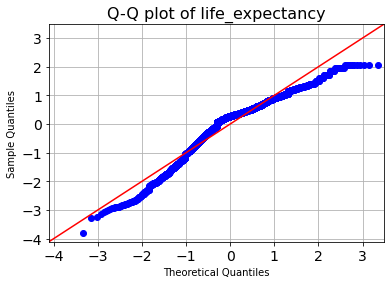

FEATURE --> adult_mortality and 2


<Figure size 720x1440 with 0 Axes>

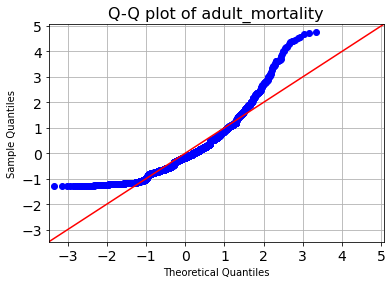

FEATURE --> infant_deaths and 3


<Figure size 720x1440 with 0 Axes>

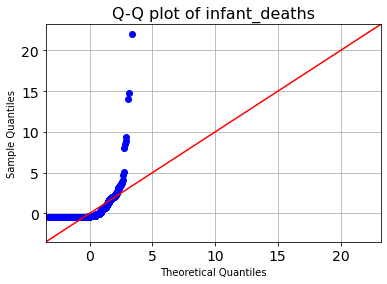

FEATURE --> alcohol and 4


<Figure size 720x1440 with 0 Axes>

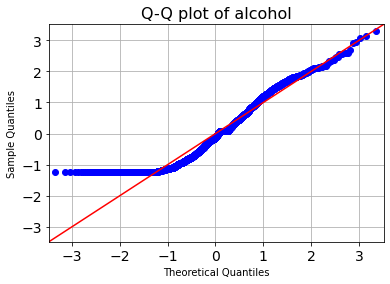

FEATURE --> percentage_expenditure and 5


<Figure size 720x1440 with 0 Axes>

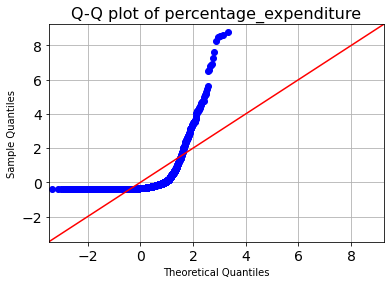

FEATURE --> hepatitis_b and 6


<Figure size 720x1440 with 0 Axes>

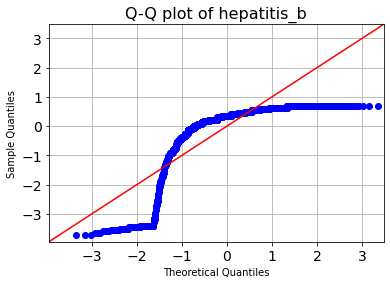

FEATURE --> measles and 7


<Figure size 720x1440 with 0 Axes>

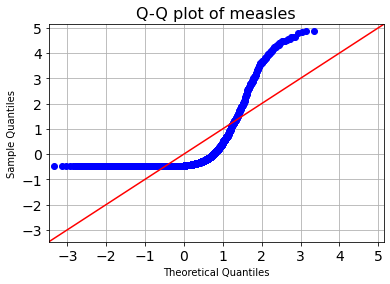

FEATURE --> under-five_deaths and 8


<Figure size 720x1440 with 0 Axes>

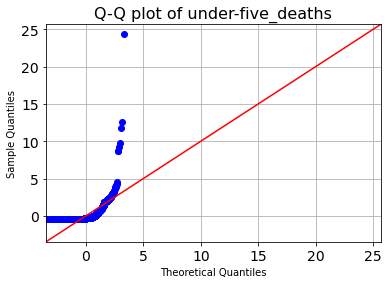

FEATURE --> polio and 9


<Figure size 720x1440 with 0 Axes>

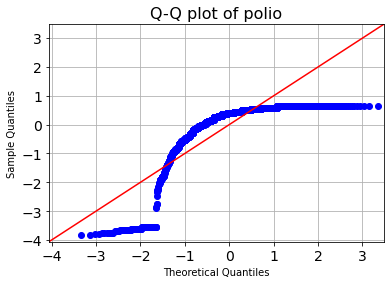

FEATURE --> total_expenditure and 10


<Figure size 720x1440 with 0 Axes>

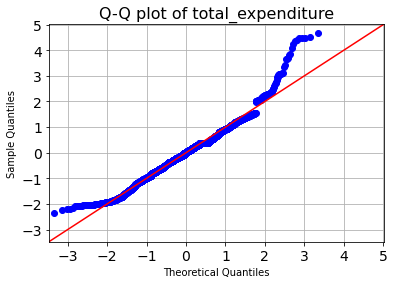

FEATURE --> diphtheria and 11


<Figure size 720x1440 with 0 Axes>

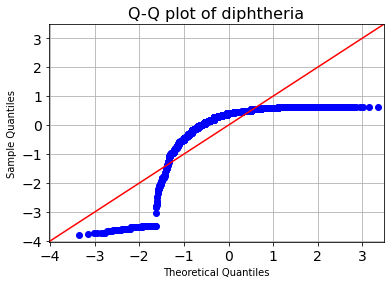

FEATURE --> hiv/aids and 12


<Figure size 720x1440 with 0 Axes>

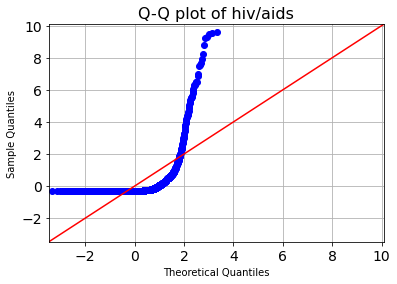

FEATURE --> gdp and 13


<Figure size 720x1440 with 0 Axes>

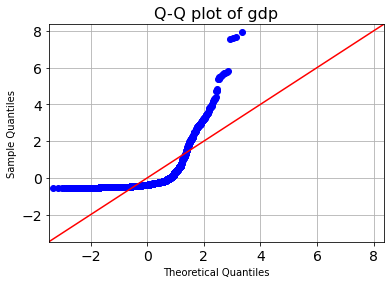

FEATURE --> population and 14


<Figure size 720x1440 with 0 Axes>

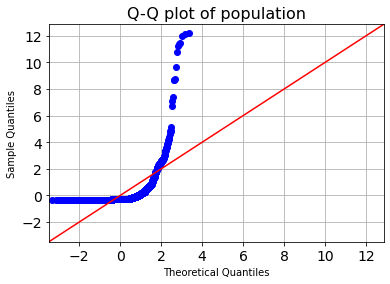

FEATURE --> thinness_1-19_years and 15


<Figure size 720x1440 with 0 Axes>

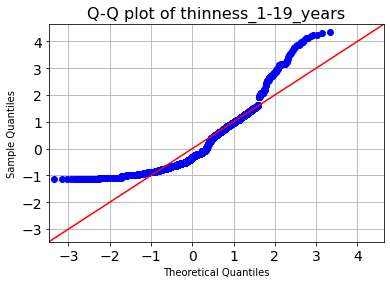

FEATURE --> thinness_5-9_years and 16


<Figure size 720x1440 with 0 Axes>

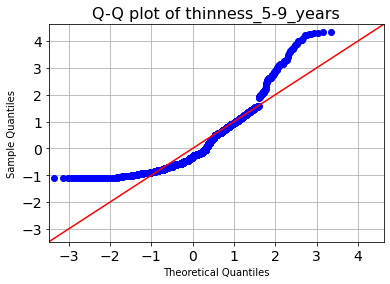

FEATURE --> income_composition_of_resources and 17


<Figure size 720x1440 with 0 Axes>

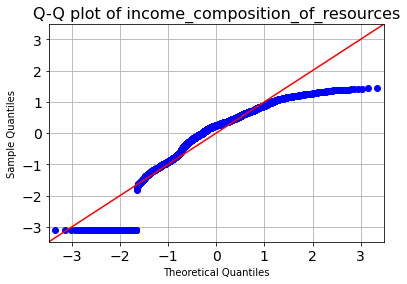

FEATURE --> schooling and 18


<Figure size 720x1440 with 0 Axes>

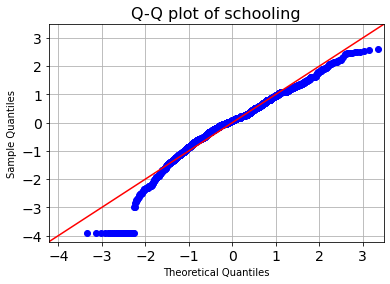

FEATURE --> log_percentage_expenditure and 19


<Figure size 720x1440 with 0 Axes>

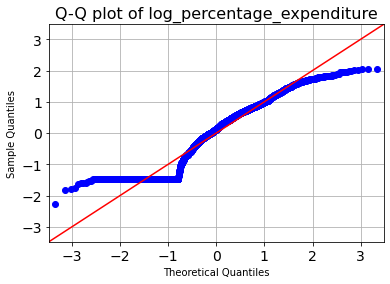

FEATURE --> log_population and 20


<Figure size 720x1440 with 0 Axes>

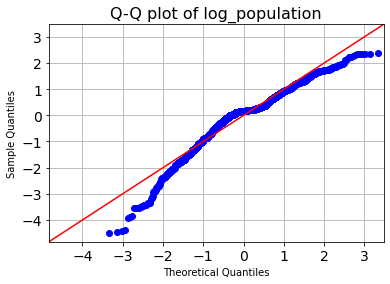

FEATURE --> log_gdp and 21


<Figure size 720x1440 with 0 Axes>

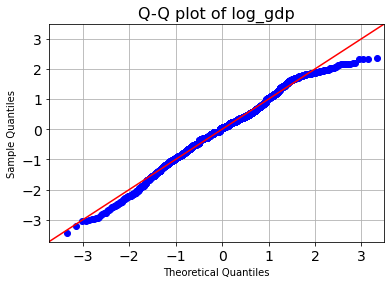

FEATURE --> winz_life_expectancy and 22


<Figure size 720x1440 with 0 Axes>

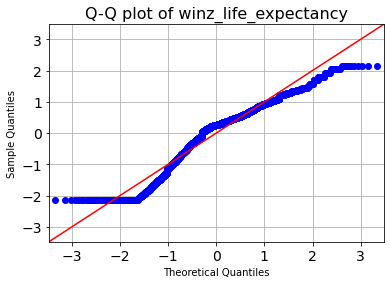

FEATURE --> winz_adult_mortality and 23


<Figure size 720x1440 with 0 Axes>

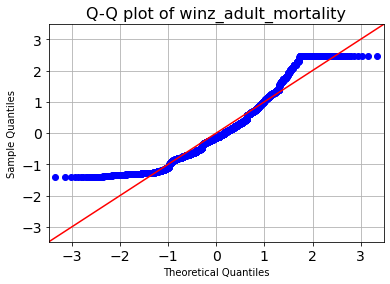

FEATURE --> winz_alcohol and 24


<Figure size 720x1440 with 0 Axes>

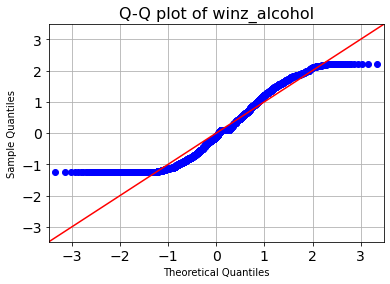

FEATURE --> winz_hepatitis_b and 25


<Figure size 720x1440 with 0 Axes>

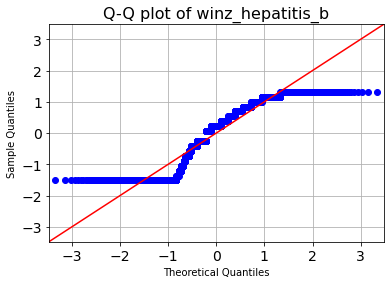

FEATURE --> winz_polio and 26


<Figure size 720x1440 with 0 Axes>

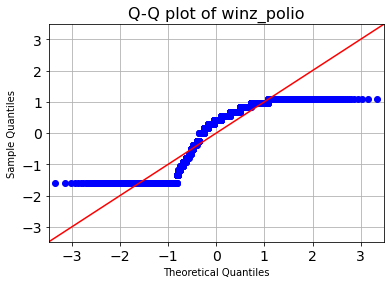

FEATURE --> winz_total_expenditure and 27


<Figure size 720x1440 with 0 Axes>

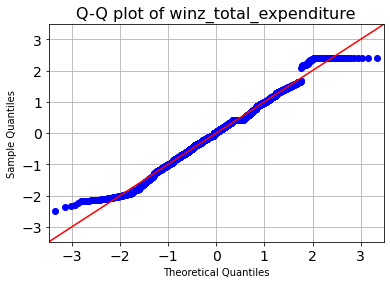

FEATURE --> winz_diphtheria and 28


<Figure size 720x1440 with 0 Axes>

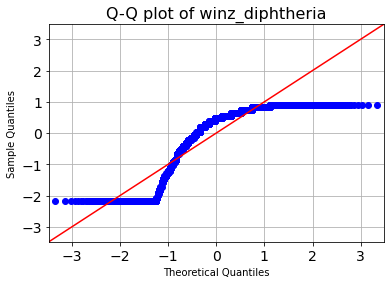

FEATURE --> winz_income_composition_of_resources and 29


<Figure size 720x1440 with 0 Axes>

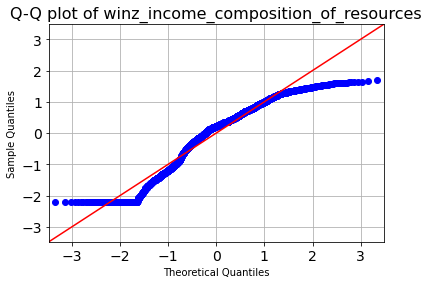

FEATURE --> winz_schooling and 30


<Figure size 720x1440 with 0 Axes>

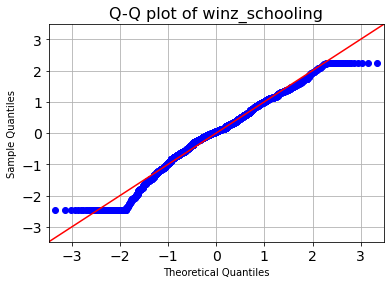

FEATURE --> winz_hiv/aids and 31


<Figure size 720x1440 with 0 Axes>

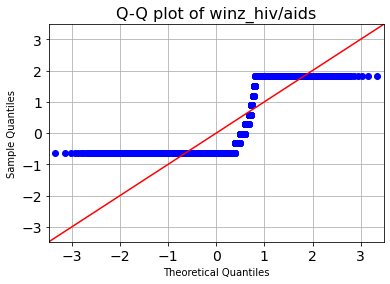

FEATURE --> winz_thinness_1-19_years and 32


<Figure size 720x1440 with 0 Axes>

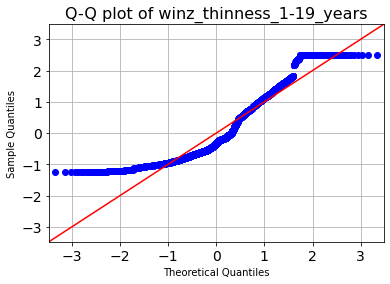

FEATURE --> winz_thinness_5-9_years and 33


<Figure size 720x1440 with 0 Axes>

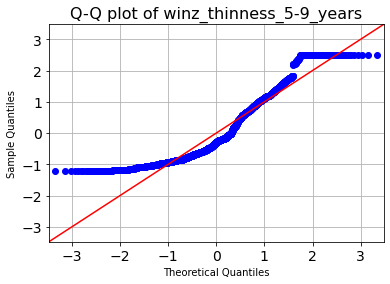

FEATURE --> Developed and 34


<Figure size 720x1440 with 0 Axes>

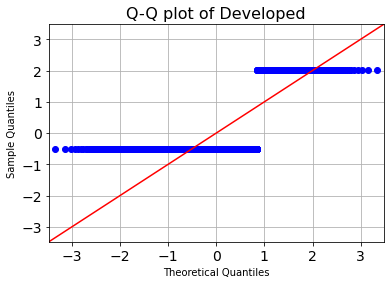

FEATURE --> Developing and 35


<Figure size 720x1440 with 0 Axes>

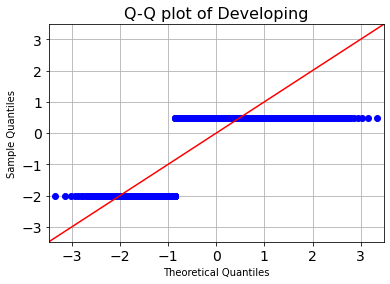

In [36]:
#What are the likely distributions of the numeric variables?
#checking the distribution of independent variables
#QQ-PLOT
from statsmodels.graphics.gofplots import qqplot
df_feature_original = df_encoder_original.copy()
df_feature_original.drop(['year','country','status'], axis=1, inplace=True)


#numeric_cols= ['life_expectancy','adult_mortality','alcohol','hepatitis_b','bmi','polio','total_expenditure','diphtheria','gdp','population','income_composition_of_resources','schooling']
# data_norm = df_impt[['life_expectancy','adult_mortality','alcohol','hepatitis_b','bmi','polio','total_expenditure','diphtheria','gdp','population','income_composition_of_resources','schooling','thinness_1-19_years','thinness_5-9_years']]
# data_norm = pd.concat([data_norm,df_impt['infant_deaths'],df_impt['hiv/aids'],df_impt['measles'],df_impt['under-five_deaths']] , axis=1)
# data_norm

for i, columns in enumerate(list(df_feature_original.columns), start=1):
  #print(f"\nFEATURE --> {numeric_cols}")
  #plt.subplot(2,6,i)
  plt.figure(figsize=(10,20))
  print(f"FEATURE --> {columns} and {i}")
  figure=qqplot(df_feature_original[columns],line='45',fit='True')
  plt.xticks(fontsize=14)
  plt.yticks(fontsize=14)
  plt.title(f"Q-Q plot of {columns}",fontsize=16)
  plt.grid(True)
  plt.show()

**INFERENCE**


---


*   From the above Q-Q Plot, we can see that almost all the independent variables/features are roughly following normal distribution

*  There are few outliers which can be further scaled by using one of the following methods


*   StandardScaler
*   MinMaxScaler
*   RobustScaler
*   Normalizer



*   We will be using RobustScaler to normalize our dataset furthermore.







---

**HISTOGRAM PLOT**


> A histogram is a chart that plots the distribution of a numeric variable's values as a series of bars. Each bar typically covers a range of numeric values called a bin or class; a bar's height indicates the frequency of data points with a value within the corresponding bin.



/usr/local/lib/python3.8/dist-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/usr/local/lib/python3.8/dist-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)
/usr/local/lib/python3.8/dist-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory.

<Figure size 1440x2880 with 0 Axes>

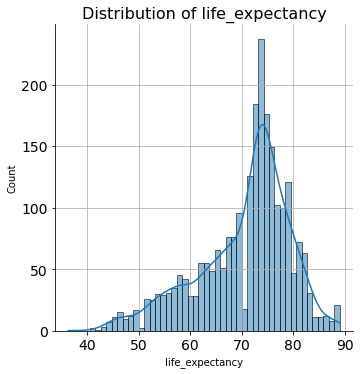

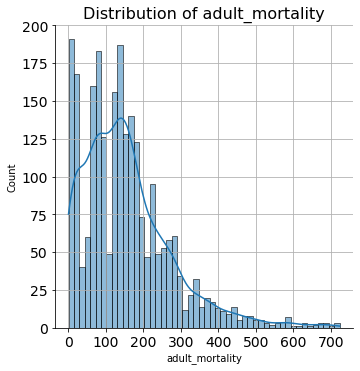

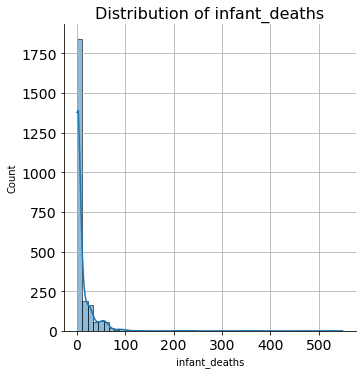

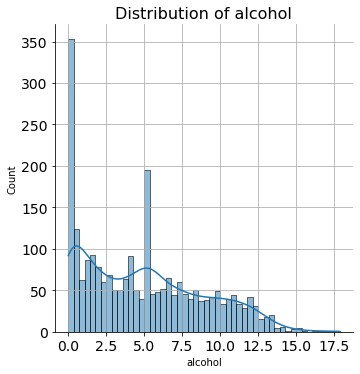

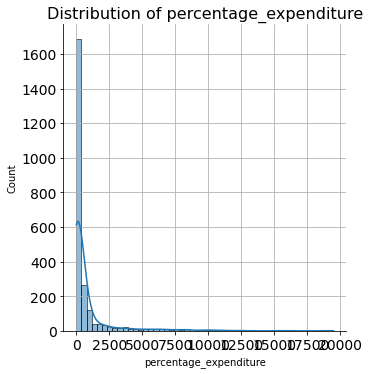

...

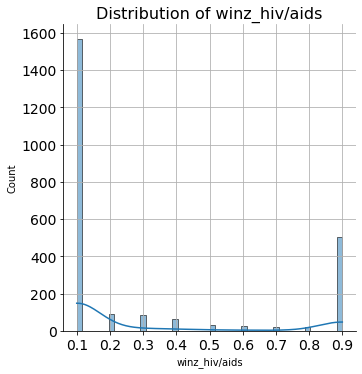

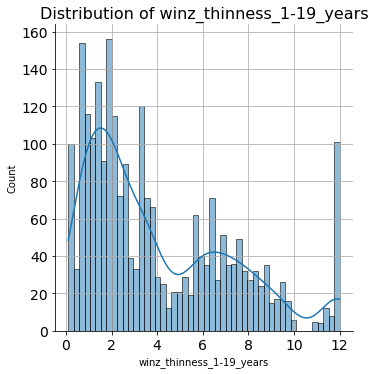

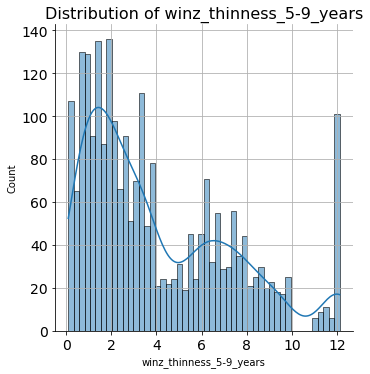

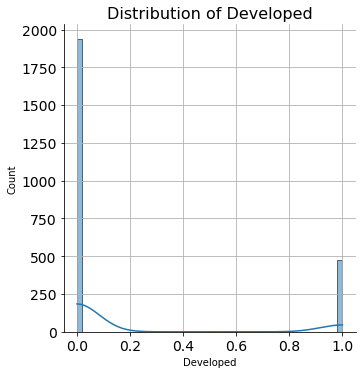

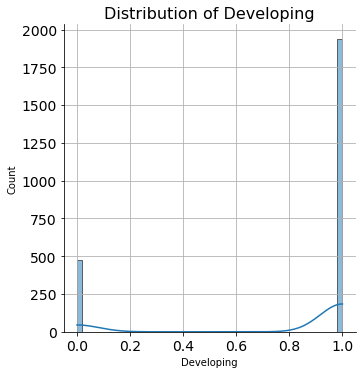

In [37]:
#histogram viz

#data_norm = df_impt[['life_expectancy','adult_mortality','alcohol','hepatitis_b','bmi','polio','total_expenditure','diphtheria','gdp','population','income_composition_of_resources','schooling']]
plt.figure(figsize=(20,40))
for i,colname in enumerate(list(df_feature_original.columns), start=1):
  
  sns.displot(df_feature_original[colname], kde=True, bins=50)
  plt.xticks(fontsize=14)
  plt.yticks(fontsize=14)
  plt.title(f"Distribution of {colname}",fontsize=16)
  plt.grid(True)

**INFERENCE**


---


*   From the above Histogram Plot, we can see that almost all the independent variables/features are roughly following normal distribution.

*   Some are right-skewed like the distribution for polio

*  There are few outliers and skweness which can be further scaled by using one of the following methods


*   StandardScaler
*   MinMaxScaler
*   RobustScaler
*   Normalizer



*   We will be using RobustScaler to normalize our dataset furthermore.




---




**Checking the Ranges of the predictor variables and dependent variable**


In [38]:
#taking only the clean table columns

old_columns = ['life_expectancy',
 'adult_mortality',
 'alcohol',
 'percentage_expenditure',
 'hepatitis_b',
 'polio',
 'total_expenditure',
 'diphtheria',
 'hiv/aids',
 'gdp',
 'population',
 'thinness_1-19_years',
 'thinness_5-9_years',
 'income_composition_of_resources',
 'schooling']

df_feature_final=df_feature_original.copy()
df_feature_final.drop(old_columns, axis=1, inplace=True)
df_feature_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2413 entries, 16 to 2905
Data columns (total 20 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   infant_deaths                         2413 non-null   int64  
 1   measles                               2413 non-null   int64  
 2   under-five_deaths                     2413 non-null   int64  
 3   log_percentage_expenditure            2413 non-null   float64
 4   log_population                        2413 non-null   float64
 5   log_gdp                               2413 non-null   float64
 6   winz_life_expectancy                  2413 non-null   float64
 7   winz_adult_mortality                  2413 non-null   float64
 8   winz_alcohol                          2413 non-null   float64
 9   winz_hepatitis_b                      2413 non-null   float64
 10  winz_polio                            2413 non-null   float64
 11  winz_total_expen

**Boxplot of the ranges of predictor and dependent variable**

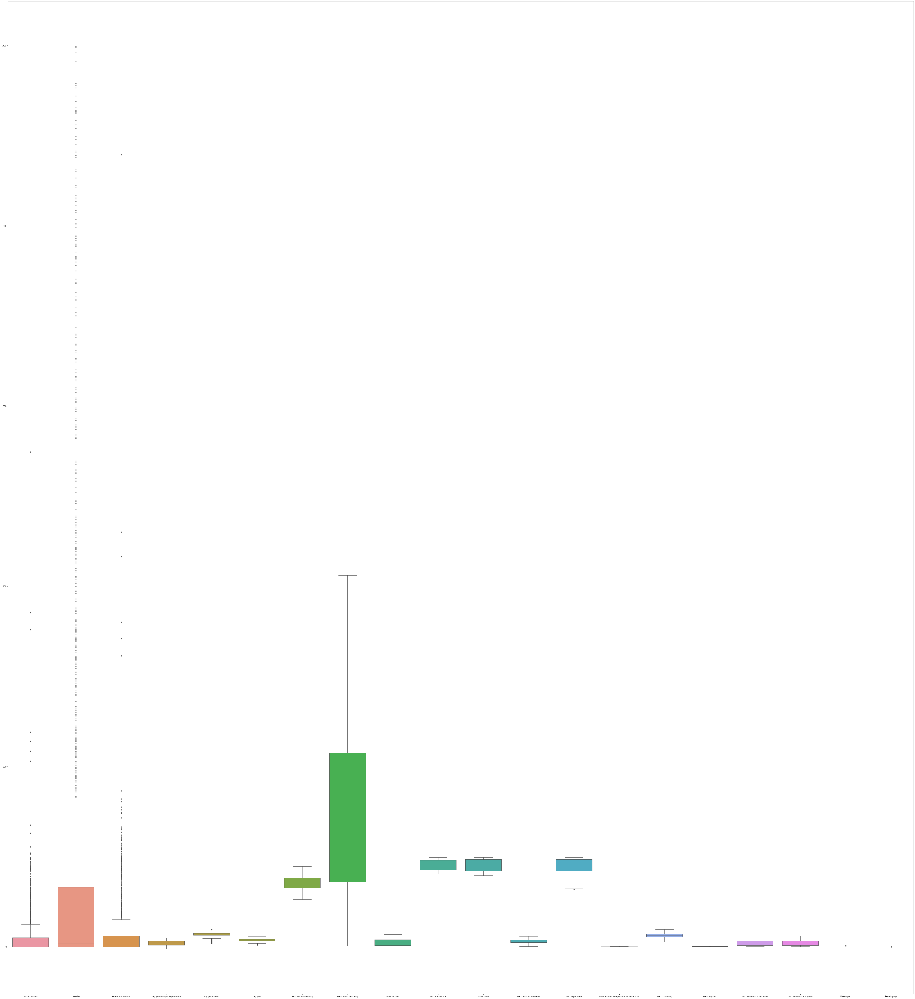

In [39]:
#checking the ranges of predictor and dependent variables

plt.figure(figsize=(80,90))
sns.boxplot(data=df_feature_final)

**INFERENCE**


---



> Since it is hard to read and visualize the range of distribution of the features, I'll further normalize using one of the normalization technique and then proceed with building the model




---




**PERFORMING NORMALIZATION USING ROBUSTSCALAR**

*  **RobustScalar** removes the median and scales the data according to the quantile range (defaults to IQR: Interquartile Range). The IQR is the range between the 1st quartile (25th quantile) and the 3rd quartile (75th quantile).





In [40]:

df_normalized_original = df_feature_final.copy()
numeric_colums_values = list(df_normalized_original.columns)

df_normalized_final = pd.DataFrame(
    RobustScaler().fit_transform(df_normalized_original[numeric_colums_values]), columns=numeric_colums_values
)
df_normalized_final
df_normalized_final.shape


(2413, 20)

In [41]:
df_normalized_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2413 entries, 0 to 2412
Data columns (total 20 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   infant_deaths                         2413 non-null   float64
 1   measles                               2413 non-null   float64
 2   under-five_deaths                     2413 non-null   float64
 3   log_percentage_expenditure            2413 non-null   float64
 4   log_population                        2413 non-null   float64
 5   log_gdp                               2413 non-null   float64
 6   winz_life_expectancy                  2413 non-null   float64
 7   winz_adult_mortality                  2413 non-null   float64
 8   winz_alcohol                          2413 non-null   float64
 9   winz_hepatitis_b                      2413 non-null   float64
 10  winz_polio                            2413 non-null   float64
 11  winz_total_expend

In [42]:
#data after normalizing and feature creation
df_normalized_final.head()

,infant_deaths,measles,under-five_deaths,log_percentage_expenditure,log_population,log_gdp,winz_life_expectancy,winz_adult_mortality,winz_alcohol,winz_hepatitis_b,winz_polio,winz_total_expenditure,winz_diphtheria,winz_income_composition_of_resources,winz_schooling,winz_hiv/aids,winz_thinness_1-19_years,winz_thinness_5-9_years,Developed,Developing
0,-0.2,-0.060606,-0.166667,0.312007,-1.611697,0.283046,0.444444,-0.426573,0.015649,0.636364,0.384615,-0.068729,0.384615,0.266094,0.405405,0.000000,-0.367347,-0.367347,0.0,0.0
1,1.9,0.893939,1.833333,-1.004098,1.432474,0.304596,0.240741,-0.811189,0.122848,0.272727,0.076923,0.302405,0.076923,0.184549,0.459459,0.000000,0.612245,0.551020,0.0,0.0
2,6.4,1.727273,8.000000,-1.004098,0.312114,0.250063,-1.888889,1.398601,0.122848,-1.000000,-1.153846,0.302405,-2.307692,-0.725322,-0.351351,2.666667,1.081633,1.040816,0.0,0.0
3,-0.2,-0.060606,-0.166667,-1.004098,0.188293,0.884666,0.314815,-0.853147,0.122848,0.636364,-0.615385,0.302405,0.384615,0.360515,0.324324,0.333333,0.061224,0.040816,0.0,0.0
4,0.6,-0.060606,0.583333,-1.004098,1.468348,0.881062,0.305556,-0.132867,0.122848,0.181818,-0.076923,0.302405,0.000000,0.540773,1.243243,0.000000,-0.408163,-0.448980,0.0,0.0


### **IDENTIFYING PREDICTOR SIGNIFICANCE OR FEATURE SELECTION**



> **Feature Selection** is the process of selecting the features which are relevant to a machine learning model. It means that you select only those attributes that have a significant effect on the model’s output.

> There are many statistical tests which are used to determine the features which are significant to build the model. Some of them are as followed:



> * F - Test


> * Information gain

> *  Z-Test

> *   Correlation test


> *   ANOVA test

> *   Chi-square test


> * Ordinary Least Square Regression (OLS)

> CORRELATION AND P-VALUE


> 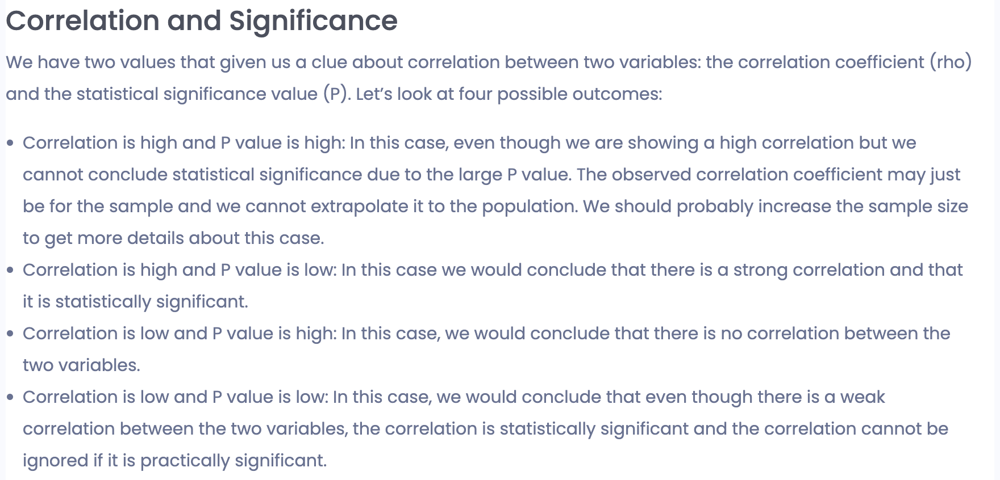

> **REFERENCES**


> https://www.analyticsvidhya.com/blog/2021/06/feature-selection-using-statistical-tests/#:~:text=Basically%2C%20the%20p%2Dvalue%20is,to%20reject%20the%20null%20hypothesis.&text=The%20degree%20of%20freedom%20is%20the%20number%20of%20independent%20variables.

> https://sigmamagic.com/blogs/correlation-coefficient/

> https://ranasinghiitkgp.medium.com/implementing-feature-selection-methods-for-machine-learning-bfa2e4b4e02





















> 



**CORRELATION TEST**

**Correlation between the features after normalization**

In [43]:
#checking the correlation between all the features in the data
df_normalized_final.corr()

,infant_deaths,measles,under-five_deaths,log_percentage_expenditure,log_population,log_gdp,winz_life_expectancy,winz_adult_mortality,winz_alcohol,winz_hepatitis_b,winz_polio,winz_total_expenditure,winz_diphtheria,winz_income_composition_of_resources,winz_schooling,winz_hiv/aids,winz_thinness_1-19_years,winz_thinness_5-9_years,Developed,Developing
infant_deaths,1.000000,0.308503,0.990513,-0.205785,0.234402,-0.257234,-0.396821,0.299522,-0.189460,-0.192523,-0.267607,-0.066021,-0.270698,-0.308857,-0.339566,0.306358,0.288396,0.303115,-0.181028,0.181028
measles,0.308503,1.000000,0.306626,-0.083086,0.126869,-0.120302,-0.201614,0.135345,-0.142434,-0.135949,-0.168801,-0.069830,-0.165243,-0.163025,-0.197212,0.151786,0.221862,0.220925,-0.039126,0.039126
under-five_deaths,0.990513,0.306626,1.000000,-0.201167,0.223083,-0.267517,-0.427420,0.321356,-0.188061,-0.204752,-0.288115,-0.069482,-0.294329,-0.332159,-0.360625,0.345709,0.299105,0.312206,-0.177397,0.177397
log_percentage_expenditure,-0.205785,-0.083086,-0.201167,1.000000,-0.062977,0.600740,0.378216,-0.272780,0.232256,0.072456,0.175830,0.063248,0.179846,0.404845,0.412471,-0.214258,-0.242851,-0.242493,0.294222,-0.294222
log_population,0.234402,0.126869,0.223083,-0.062977,1.000000,0.016529,-0.045758,0.086453,0.043143,-0.030702,-0.023093,-0.024432,-0.005819,0.002666,-0.005378,0.065775,-0.012995,-0.011945,-0.001651,0.001651
log_gdp,-0.257234,-0.120302,-0.267517,0.600740,0.016529,1.000000,0.560605,-0.370140,0.370382,0.188907,0.325422,0.127070,0.308304,0.621324,0.585837,-0.420449,-0.345655,-0.347860,0.391810,-0.391810
winz_life_expectancy,-0.396821,-0.201614,-0.427420,0.378216,-0.045758,0.560605,1.000000,-0.705565,0.415277,0.294155,0.525098,0.219084,0.518652,0.794454,0.756640,-0.778526,-0.577923,-0.584153,0.492374,-0.492374
winz_adult_mortality,0.299522,0.135345,0.321356,-0.272780,0.086453,-0.370140,-0.705565,1.000000,-0.203769,-0.216628,-0.351470,-0.134630,-0.336270,-0.541268,-0.500874,0.597770,0.407771,0.414454,-0.331004,0.331004
winz_alcohol,-0.189460,-0.142434,-0.188061,0.232256,0.043143,0.370382,0.415277,-0.203769,1.000000,0.107327,0.258240,0.299088,0.261954,0.476443,0.514541,-0.252906,-0.454339,-0.442802,0.591579,-0.591579
winz_hepatitis_b,-0.192523,-0.135949,-0.204752,0.072456,-0.030702,0.188907,0.294155,-0.216628,0.107327,1.000000,0.728338,0.027694,0.663722,0.283699,0.260990,-0.296844,-0.065462,-0.074906,0.120530,-0.120530


**Visualizing Data Distribution after normalization**

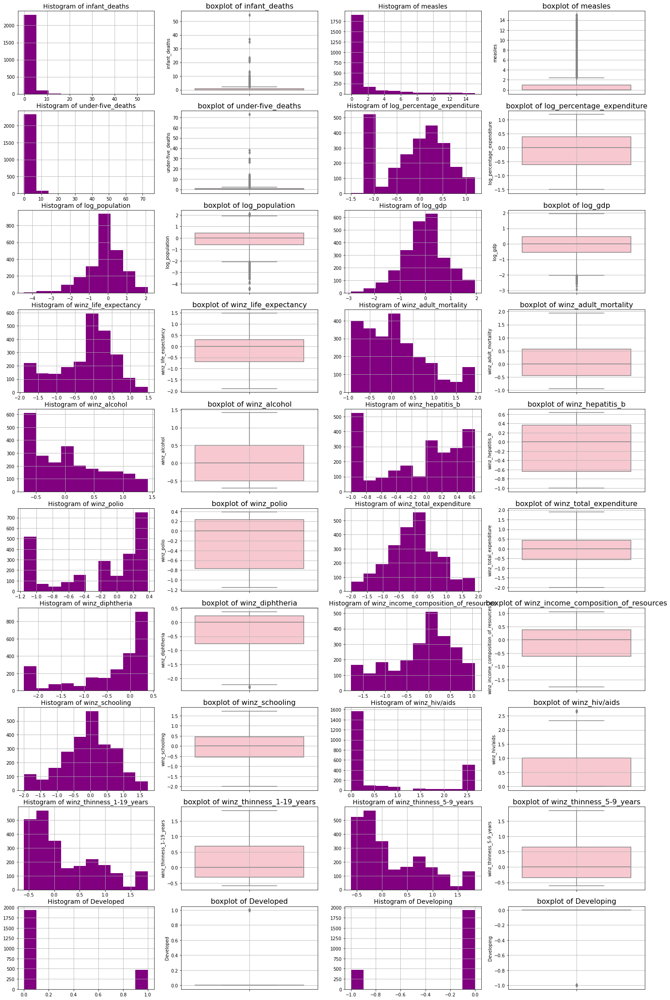

In [44]:
plt.figure(figsize=(25,40))
#sns.boxplot(data=data_norm)
i=0

for column in list(df_normalized_final.columns):
  i+=1
  plt.subplot(10,4,i)
  #sns.displot(df_combined_new[column], kde=True, bins=60, color='purple')
  plt.hist(df_normalized_final[column],color="purple")
  plt.title(f'Histogram of {column}', fontsize=14)
  plt.grid(True)
  
  i+=1
  plt.subplot(10,4,i)
  sns.boxplot(y=df_normalized_final[column],color="pink")
  plt.title(f'boxplot of {column}', fontsize=16)
  plt.grid(True)

plt.show()

**Boxplot of the ranges of predictor and dependent variable after normalizing the data**

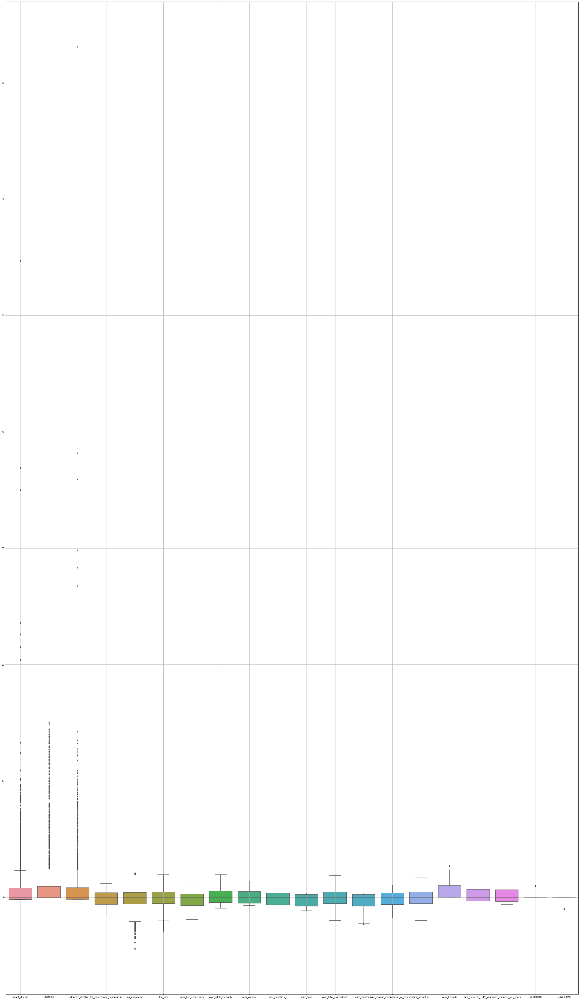

In [45]:
#checking the ranges of predictor and dependent variables

plt.figure(figsize=(45,80))
sns.boxplot(data=df_normalized_final)
plt.grid(True)

**Visualizing Heatmap of correlation after the normalization**

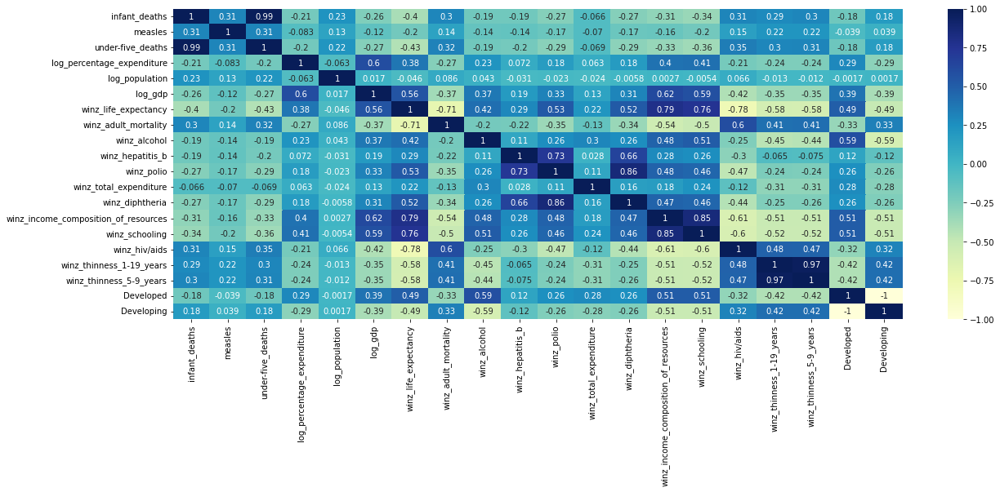

In [46]:
#the heat map of the correlation
plt.figure(figsize=(20,7))
sns.heatmap(df_normalized_final.corr(), annot=True, cmap='YlGnBu')

**Visualizing Pair plot of the correlation between features after normalization**

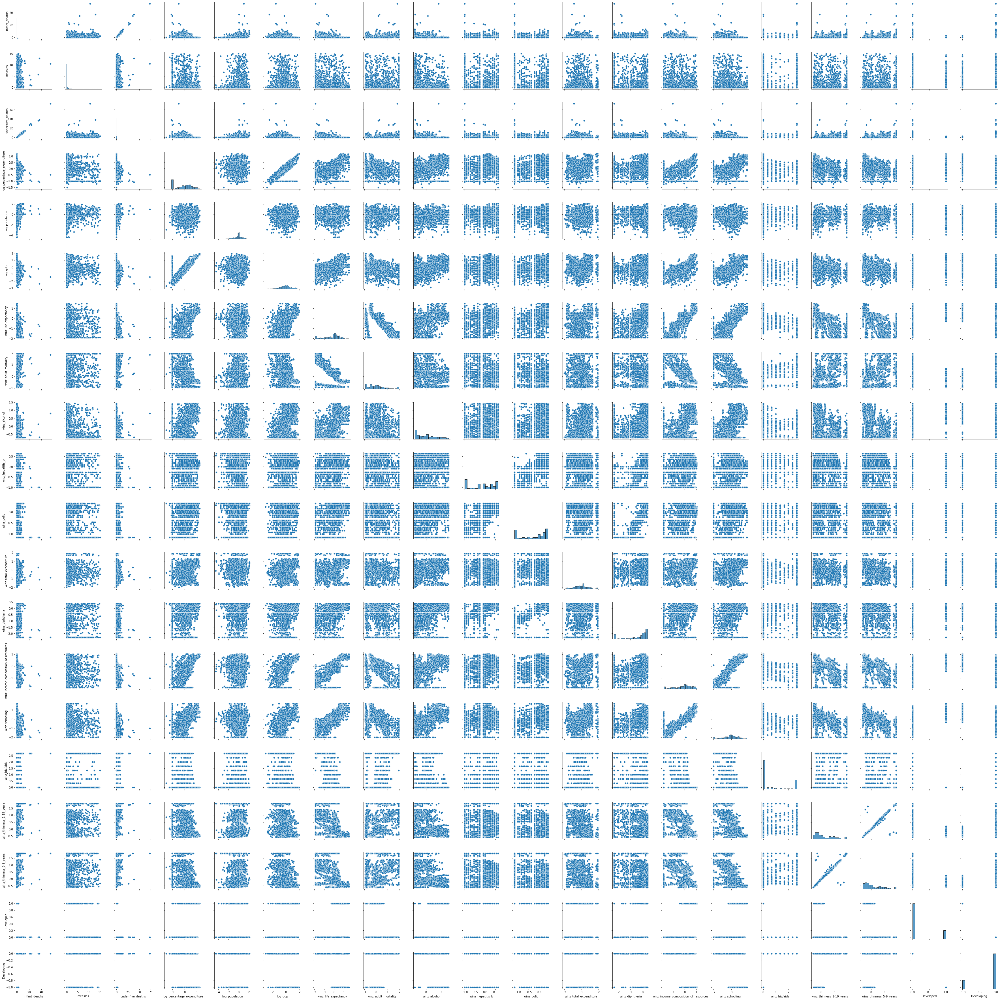

In [47]:
#pair plot to check the colinearity
sns.pairplot(df_normalized_final)

**INFERENCE**


---
From the above visualizations we can infer the following:



> **BOXPLOT**


*   **infant_deaths, measles, under-five_deaths, log_population, log_gdp** have outliers which means that the abnormalities grew higher than expected.

*   Features such as **winz_adult_mortality, winz_alcohol, winz_total_expenditure, winz_schooling** appear to be symmetric through the boxplot.

*   Features such as **winz_diptheria, winz_polio, winz_thinness** appear to be skewed



> **HEATMAP**


*   We see a lot of correlation between the vraiables/features through the heatmap.

*   Life expectancy has the highest positive correlation with **income_composition_of_resources** followed by **schooling**, with the coefficient values being **0.79, 0.76**. From this we can infer that as these features increase we see the life_expectancy also to increase.

*   Life expectancy has the  negative correlation with **adult_mortality**  with the coefficient values being **-0.71**. From this we can infer that as adult_mortality decreases we see the life_expectancy  to increase.


> **PAIR PLOT**

*   In the pair plot, we see that **income_composition_of_resources** and **schooling** have a high positive correlation, which means as the income and availability of a country increases it leads to increase in the schooling of the children.

*   In the pair plot, we see that **percentage_expenditure** and **gdp** have a high positive correlation, which means as the gdp of a country increases it leads to increase in the percentage_expenditure of the country.














---

**ORDINARY LEAST SQUARE REGRESSION TEST (OLS)**



> Ordinary Least Squares regression (OLS) is a common technique for estimating coefficients of linear regression equations which describe the relationship between one or more independent quantitative variables and a dependent variable (simple or multiple linear regression).





> https://vitalflux.com/ordinary-least-squares-method-concepts-examples/



> https://towardsdatascience.com/understanding-the-ols-method-for-simple-linear-regression-e0a4e8f692cc





In [48]:
#OLS for finding the p value to check the significant features

df_ols_original = df_normalized_final.copy()
df = df_ols_original.drop(['winz_life_expectancy'], axis=1)
columns = list(df.columns)
#columns
import statsmodels.api as sm

model = sm.OLS(df_ols_original['winz_life_expectancy'],df_ols_original[columns]).fit()

model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                  OLS Regression Results                                 
=========================================================================================
Dep. Variable:     winz_life_expectancy   R-squared (uncentered):                   0.847
Model:                              OLS   Adj. R-squared (uncentered):              0.846
Method:                   Least Squares   F-statistic:                              734.8
Date:                  Sat, 04 Feb 2023   Prob (F-statistic):                        0.00
Time:                          06:00:51   Log-Likelihood:                         -660.59
No. Observations:                  2413   AIC:                                      1357.
Df Residuals:                      2395   BIC:                                      1461.
Df Model:                            18                                                  
Covariance Type:              nonrobust                                                  
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
infant_deaths                            0.0747      0.021      3.642      0.000       0.034       0.115
measles                                 -0.0004      0.002     -0.184      0.854      -0.005       0.004
under-five_deaths                       -0.0763      0.017     -4.444      0.000      -0.110      -0.043
log_percentage_expenditure               0.0296      0.013      2.254      0.024       0.004       0.055
log_population                          -0.0028      0.007     -0.401      0.689      -0.017       0.011
log_gdp                                  0.0387      0.011      3.384      0.001       0.016       0.061
winz_adult_mortality                    -0.2444      0.012    -21.143      0.000      -0.267      -0.222
winz_alcohol                             0.0003      0.015      0.018      0.986      -0.028       0.029
winz_hepatitis_b                        -0.0757      0.017     -4.499      0.000      -0.109      -0.043
winz_polio                               0.0739      0.026      2.888      0.004       0.024       0.124
winz_total_expenditure                   0.0176      0.009      1.976      0.048       0.000       0.035
winz_diphtheria                          0.0559      0.015      3.710      0.000       0.026       0.086
winz_income_composition_of_resources     0.2521      0.019     13.405      0.000       0.215       0.289
winz_schooling                           0.0870      0.017      5.214      0.000       0.054       0.120
winz_hiv/aids                           -0.1941      0.008    -23.065      0.000      -0.211      -0.178
winz_thinness_1-19_years                 0.1196      0.042      2.867      0.004       0.038       0.201
winz_thinness_5-9_years                 -0.2060      0.041     -4.999      0.000      -0.287      -0.125
Developed                                0.0905      0.010      8.910      0.000       0.071       0.110
Developing                              -0.0905      0.010     -8.910      0.000      -0.110      -0.071
==============================================================================
Omnibus:                       61.094   Durbin-Watson:                   2.053
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              136.117
Skew:                           0.079   Prob(JB):                     2.77e-30
Kurtosis:                       4.153   Cond. No.                     3.99e+16
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is corr

**INFERENCE**


---


> The **p-value** for each term tests the **null hypothesis** that the **coefficient** is equal to zero (no effect). A **low p-value (< 0.05)** indicates that you can **reject the null hypothesis**. In other words, a predictor that has a low p-value is likely to be a meaningful addition to your model because changes in the predictor's value are related to changes in the response variable.



> Conversely, a larger (insignificant) p-value suggests that changes in the predictor are not associated with changes in the response.



> **RESULT OF OLS TESTING**







    1. infant_deaths has p-value of 0, which is < 0.05 --> significant feature

    2. measles has p-value of 0.8, which is > 0.05 --> insignificant feature

    3. under-five_deaths has p-value of 0, which is < 0.05 --> significant feature

    4. log_percentage_expenditure has p-value of 0.024, which is < 0.05 --> significant feature

    5. log_population has p-value of 0.68, which is > 0.05 --> insignificant feature

    6. log_gdp has p-value of 0.001, which is < 0.05 --> significant feature

    7. winz_adult_mortality has p-value of 0, which is < 0.05 --> significant feature

    8. winz_alcohol has p-value of 0.98, which is > 0.05 --> insignificant feature

    9. winz_hepatitis_b has p-value of 0, which is < 0.05 --> significant feature

    10. winz_polio has p-value of 0.004, which is < 0.05 --> significant feature

    11. winz_total_expenditure has p-value of 0.048, which is < 0.05 --> significant feature

    12. winz_diphtheria has p-value of 0, which is < 0.05 --> significant feature

    13. winz_income_composition_of_resources  has p-value of 0, which is < 0.05 --> significant feature

    14. winz_schooling has p-value of 0, which is < 0.05 --> significant feature

    15. winz_hiv/aids has p-value of 0, which is < 0.05 --> significant feature

    16. winz_thinness_1-19_years has p-value of 0.004, which is < 0.05 --> significant feature

    17. winz_thinness_5-9_years has p-value of 0, which is < 0.05 --> significant feature

    18. Developed has p-value of 0, which is < 0.05 --> significant feature

    19. Developing has p-value of 0, which is < 0.05 --> significant feature


---





**F-TEST : f_regression method**


>In general, the Regression F-test is used to test whether the regression model fits the data better than the model with no feature.




In [49]:


df_ols_original = df_normalized_final.copy()
df = df_ols_original.drop(['winz_life_expectancy'], axis=1)
columns = list(df.columns)
y = df_ols_original['winz_life_expectancy']
X = df_ols_original[columns]

from sklearn.feature_selection import SelectKBest, mutual_info_regression
#Select top 2 features based on mutual info regression
selector = SelectKBest(mutual_info_regression, k =10)
selector.fit(X, y)
X.columns[selector.get_support()]

Index(['infant_deaths', 'under-five_deaths', 'log_gdp', 'winz_adult_mortality',
       'winz_alcohol', 'winz_income_composition_of_resources',
       'winz_schooling', 'winz_hiv/aids', 'winz_thinness_1-19_years',
       'winz_thinness_5-9_years'],
      dtype='object')

In [50]:
from sklearn.datasets import load_boston
from sklearn.feature_selection import f_regression
import pandas as pd
import statsmodels.api as sm
from pandas.testing import assert_frame_equal

y = df_ols_original['winz_life_expectancy']
X = df_ols_original[columns]

# sklearn f_regression method
F, pval = f_regression(X, y)
F_df = pd.DataFrame({"F_score": F, "p_value": pval})

F_df

,F_score,p_value
0,450.609888,8.055823e-92
1,102.155444,1.501190e-23
2,538.914360,9.175623e-108
3,402.457571,6.478224e-83
4,5.058668,2.459297e-02
5,1105.002155,8.674719e-200
6,2390.088506,0.000000e+00
7,502.436693,3.086049e-101
8,228.377987,2.285128e-49
9,917.858193,3.998011e-171


### **BUILDING THE MODEL**

**TRAIN, TEST SPLIT**

In [51]:
from sklearn.model_selection import train_test_split

insignificang_features = ['measles','log_population','winz_alcohol']
df_model_original = df_normalized_final.copy()

#Removing the insignificant features before modeling
df_model_original.drop(insignificang_features, axis=1, inplace=True)
df_model_original.info()
df = df_model_original.drop(['winz_life_expectancy'], axis=1)
columns = list(df.columns)
X = df_model_original[columns]
y = df_model_original['winz_life_expectancy']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2413 entries, 0 to 2412
Data columns (total 17 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   infant_deaths                         2413 non-null   float64
 1   under-five_deaths                     2413 non-null   float64
 2   log_percentage_expenditure            2413 non-null   float64
 3   log_gdp                               2413 non-null   float64
 4   winz_life_expectancy                  2413 non-null   float64
 5   winz_adult_mortality                  2413 non-null   float64
 6   winz_hepatitis_b                      2413 non-null   float64
 7   winz_polio                            2413 non-null   float64
 8   winz_total_expenditure                2413 non-null   float64
 9   winz_diphtheria                       2413 non-null   float64
 10  winz_income_composition_of_resources  2413 non-null   float64
 11  winz_schooling   

In [52]:
X_train.head()

,infant_deaths,under-five_deaths,log_percentage_expenditure,log_gdp,winz_adult_mortality,winz_hepatitis_b,winz_polio,winz_total_expenditure,winz_diphtheria,winz_income_composition_of_resources,winz_schooling,winz_hiv/aids,winz_thinness_1-19_years,winz_thinness_5-9_years,Developed,Developing
1399,0.2,0.250000,0.077637,-0.144998,0.076923,0.545455,0.307692,-0.838488,0.307692,0.107296,0.135135,0.000000,1.836735,1.836735,0.0,0.0
87,0.6,0.833333,-1.004098,-0.316143,-0.769231,-1.000000,-1.153846,0.302405,-1.615385,-0.802575,-1.135135,2.666667,0.979592,0.897959,0.0,0.0
1384,-0.2,-0.166667,-1.004098,-0.146484,0.111888,0.636364,0.384615,0.209622,0.384615,0.030043,0.027027,0.000000,0.265306,0.265306,0.0,0.0
1104,2.8,3.750000,0.104342,-0.324276,1.629371,0.181818,-0.076923,-0.505155,0.000000,-0.781116,-0.297297,2.666667,0.755102,0.714286,0.0,0.0
589,4.7,7.333333,-0.247203,-0.845440,0.678322,-1.000000,-1.153846,-0.030928,-1.769231,-1.583691,-2.000000,2.000000,-0.346939,-0.408163,0.0,0.0


**DISTRIBUTION OF TRAINING DATA**

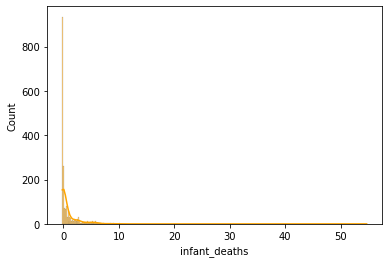

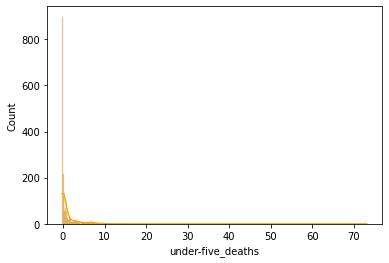

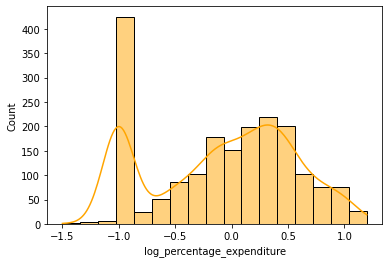

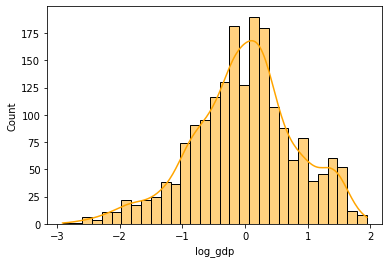

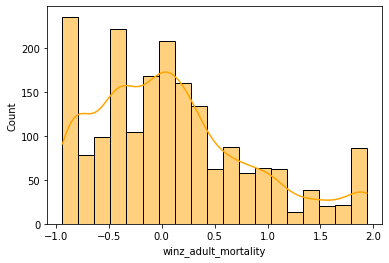

...

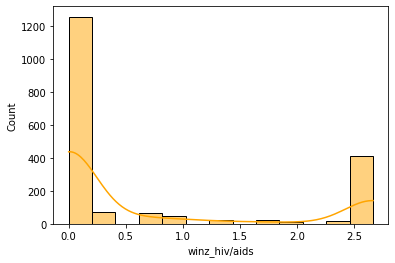

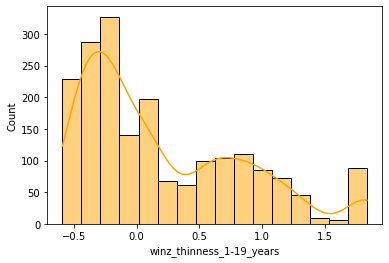

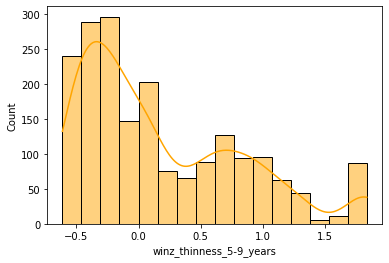

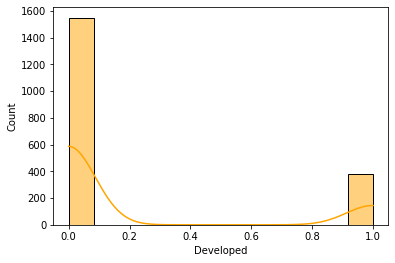

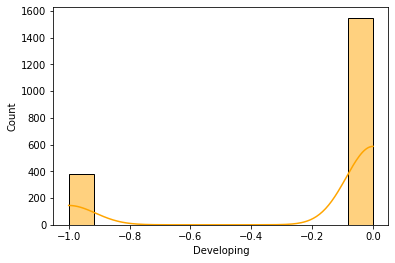

In [53]:
for i, col in enumerate(X_train.columns):
    plt.figure(i)
    sns.histplot(X_train[col], kde=True, color="orange")

**COMPARING TRAINING AND TESTING DATA**

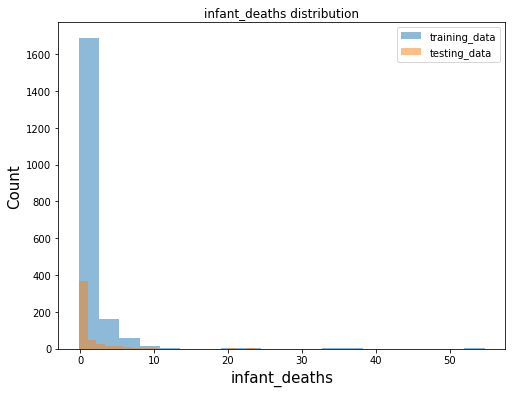

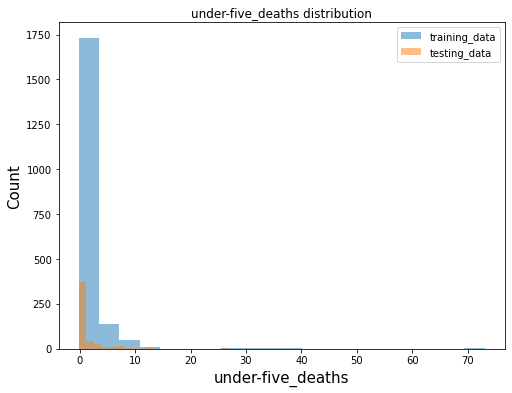

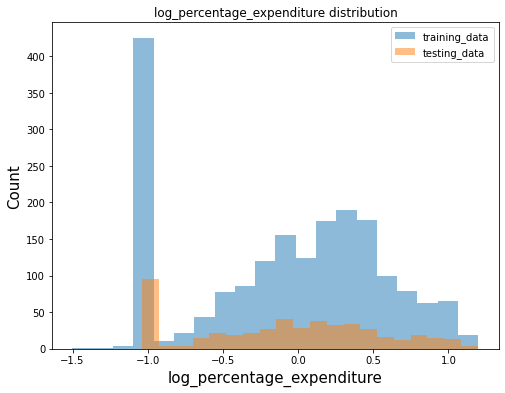

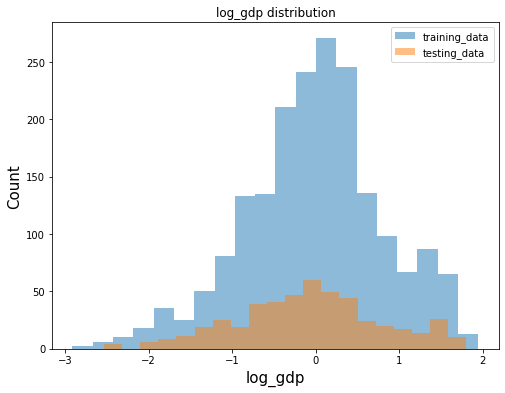

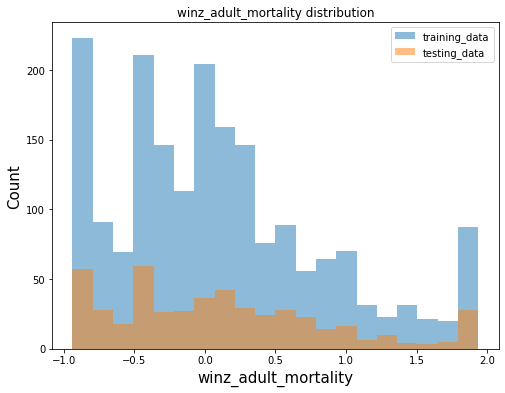

...

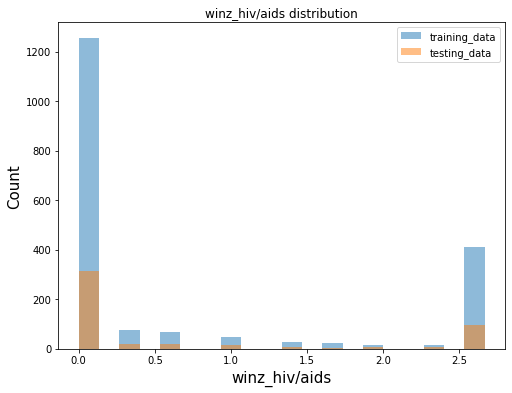

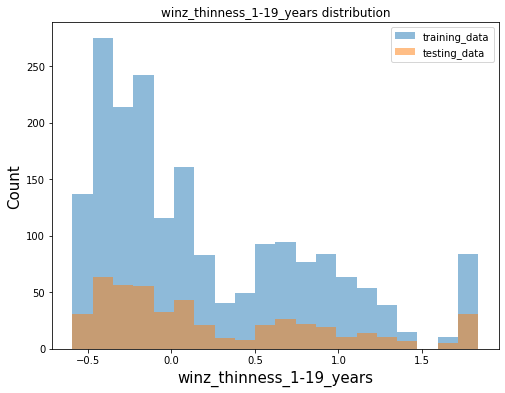

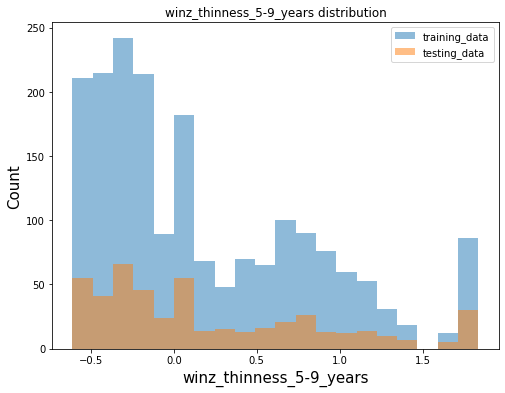

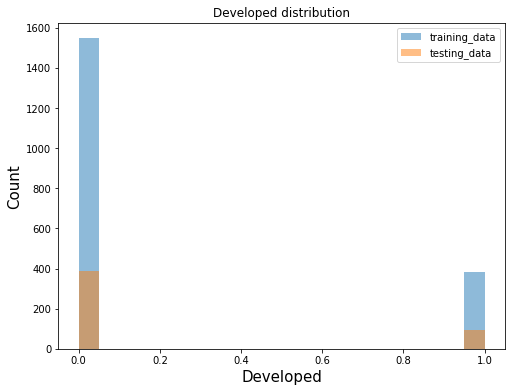

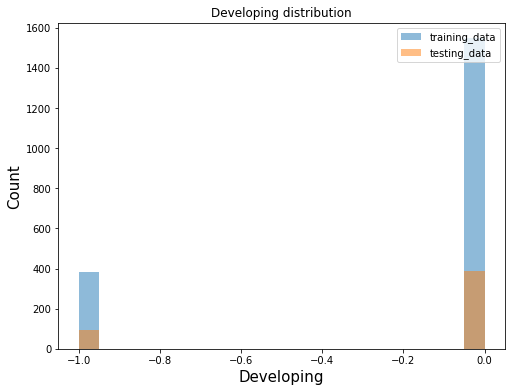

In [54]:
#Training and test data Comparison
for columns in list(X_train.columns):
  plt.figure(figsize=(8,6))
  plt.hist(X_train[columns], bins=20, alpha=0.5, label='training_data')
  plt.hist(X_test[columns], bins=20, alpha=0.5, label='testing_data')
  plt.xlabel(columns, size=15)
  plt.ylabel("Count", size=15)
  plt.title(f'{columns} distribution')
  plt.legend(loc="upper right")
  plt.show()
  

### **LINEAR REGRESSION**

**Fit the model using the training data**

In [55]:

from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn import datasets, linear_model


lm = LinearRegression()
lm.fit(X_train, y_train)

LinearRegression()

**Model Coefficients**

In [56]:
#PRINT COEFFICIENTS OF THE MODEL
lm.coef_

array([ 0.0422546 , -0.04959723,  0.04172283,  0.03288417, -0.23656306,
       -0.08466796,  0.07444841,  0.02992643,  0.07197487,  0.26754924,
        0.05708232, -0.22463297,  0.10418632, -0.20825339,  0.05082298,
       -0.05082298])

In [57]:
#COEFFICIENT OF THE INDEPENDANT VARIABLES
cdf = pd.DataFrame(lm.coef_,X.columns, columns=['Coeff'])
cdf

,Coeff
infant_deaths,0.042255
under-five_deaths,-0.049597
log_percentage_expenditure,0.041723
log_gdp,0.032884
winz_adult_mortality,-0.236563
winz_hepatitis_b,-0.084668
winz_polio,0.074448
winz_total_expenditure,0.029926
winz_diphtheria,0.071975
winz_income_composition_of_resources,0.267549


**PREDICTIONS AND EVALUATION**

**TRAINING DATASET**

In [58]:
#PREDICTION ON THE TRAINING SET
#EVALUATE THE MODEL

y_predictions = lm.predict(X_train)

from sklearn import metrics

print('Mean Absolute Error [MAE]: ', round(metrics.mean_absolute_error(y_train,y_predictions),2))
print('Mean Square Error [MSE]: ', round(metrics.mean_squared_error(y_train, y_predictions),2))
print('Root mean Square Error [RMSE]: ', round(np.sqrt(metrics.mean_squared_error(y_train, y_predictions)),3))
print('\nCoefficient of Determination :', round(r2_score(y_train,y_predictions)))

r2 = r2_score(y_train,y_predictions)
print('R^2 score on training set =',r2)

Mean Absolute Error [MAE]:  0.23
Mean Square Error [MSE]:  0.1
Root mean Square Error [RMSE]:  0.313

Coefficient of Determination : 1
R^2 score on training set = 0.8394553636541762


**TEST DATASET**

In [59]:
#PREDICTION ON THE TRAINING SET
#EVALUATE THE MODEL

y_predictions = lm.predict(X_test)

from sklearn import metrics

print('Mean Absolute Error [MAE]: ', round(metrics.mean_absolute_error(y_test,y_predictions),2))
print('Mean Square Error [MSE]: ', round(metrics.mean_squared_error(y_test, y_predictions),2))
print('Root mean Square Error [RMSE]: ', round(np.sqrt(metrics.mean_squared_error(y_test, y_predictions)),3))
print('\nCoefficient of Determination :', round(r2_score(y_test,y_predictions)))

r2 = r2_score(y_test,y_predictions)
print('R^2 score on training set =',r2)

Mean Absolute Error [MAE]:  0.25
Mean Square Error [MSE]:  0.11
Root mean Square Error [RMSE]:  0.326

Coefficient of Determination : 1
R^2 score on training set = 0.8331176308978094


**SCATTER PLOT OF THE REAL TEST VALUES VERSUS THE PREDICTED VALUES**

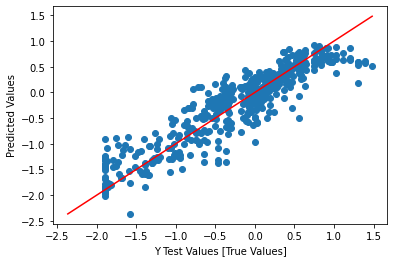

In [60]:
#SCATTER PLOT OF THE REAL TEST VALUES VERSUS THE PREDICTED VALUES
plt.scatter(y_test, y_predictions)
plt.xlabel('Y Test Values [True Values]')
plt.ylabel('Predicted Values')

p1 = max(max(y_predictions), max(y_test))
p2 = min(min(y_predictions), min(y_test))
plt.plot([p1, p2], [p1, p2], 'r-')

We see that the model build is fairly alog the best fitted line and is seen to be significantly colinear


---



**EXPLAINED VARIANCE or R-SQUARE**



> The explained variation is the sum of the squared of the differences between each predicted y-value and the mean of y.


>  It is a very important concept to understand how much information we can lose by reconciling the dataset.

>https://corporatefinanceinstitute.com/resources/data-science/r-squared/










In [61]:
metrics.explained_variance_score(y_test, y_predictions)

0.8331181521198573

**RESIDUALS**

> A residual is the difference between an observed value and a predicted value in regression analysis.


> Residual = Observed value – Predicted value



> The Histogram of the Residual can be used to check whether the variance is normally distributed. A symmetric bell-shaped histogram which is evenly distributed around zero indicates that the normality assumption is likely to be true.





> https://www.ncl.ac.uk/webtemplate/ask-assets/external/maths-resources/statistics/regression-and-correlation/residuals.html#:~:text=Definition,yi%E2%88%92%5Eyi.

> https://www.khanacademy.org/math/statistics-probability/describing-relationships-quantitative-data/regression-library/a/introduction-to-residuals

> 







/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


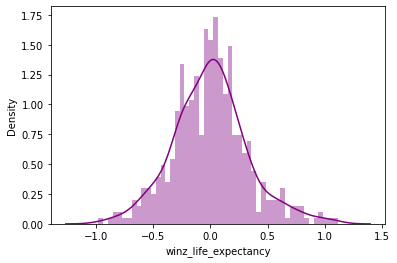

In [62]:
#RESIDUALS

sns.distplot((y_test-y_predictions), bins=50, color='purple')

**UNDERSTANDING THE IMPORTANT FEATURES**

In [63]:
# !pip install eli5

In [64]:
# !pip freeze list

In [65]:
#Understanding the important features 
import eli5
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(lm, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names = X_test.columns.tolist())

Weight,Feature
0.1722 ± 0.0247,winz_hiv/aids
0.1447 ± 0.0272,winz_income_composition_of_resources
0.0971 ± 0.0327,winz_adult_mortality
0.0629 ± 0.0084,under-five_deaths
0.0587 ± 0.0066,winz_thinness_5-9_years
0.0208 ± 0.0030,infant_deaths
0.0184 ± 0.0053,winz_thinness_1-19_years
0.0139 ± 0.0025,winz_diphtheria
0.0091 ± 0.0021,winz_schooling
0.0074 ± 0.0037,winz_hepatitis_b


**PERMUTATION MODEL**

> Permutation importance is calculated after a model has been fitted.

> The values towards the top are the most important features, and those towards the bottom matter least.


> The values towards the top are the most important features, and those towards the bottom matter least.


---



---









### **Answer the following questions:**


---



1. **What are the data types? (Only numeric and categorical)**



> The below screenshot displays the column names and their corresponding datatype.

> The numeric columns:


*   life_expectancy

*   adult_mortality

*   infant_deaths
*   alcohol


*   percentage_expenditure


*   hepatitis_b


*   measles
*   bmi

*   under-five_deaths

*   polio 

*   total_expenditure
*   diphtheria


*   hiv/aids 

*   gdp
*   population


*   thinness_1-19_years 
*   thinness_5-9_years

*   income_composition_of_resources
*   schooling




> Categorical columns

*   status - developed, developing

**2. Are there missing values?**


> Yes, there are missing values in few of the columns and appropriate imputation has been performed after the analysis of the values.



**3. What are the likely distributions of the numeric variables?**


> From the following visualizations we can infer the following about the distribution of the numeric values:



> **BOXPLOT**


*   **infant_deaths, measles, under-five_deaths, log_population, log_gdp** have outliers which means that the abnormalities grew higher than expected.

*   Features such as **winz_adult_mortality, winz_alcohol, winz_total_expenditure, winz_schooling** appear to be symmetric through the boxplot.

*   Features such as **winz_diptheria, winz_polio, winz_thinness** appear to be skewed



> **HEATMAP**


*   We see a lot of correlation between the vraiables/features through the heatmap.

*   Life expectancy has the highest positive correlation with **income_composition_of_resources** followed by **schooling**, with the coefficient values being **0.79, 0.76**. From this we can infer that as these features increase we see the life_expectancy also to increase.

*   Life expectancy has the  negative correlation with **adult_mortality**  with the coefficient values being **-0.71**. From this we can infer that as adult_mortality decreases we see the life_expectancy  to increase.


> **PAIR PLOT**

*   In the pair plot, we see that **income_composition_of_resources** and **schooling** have a high positive correlation, which means as the income and availability of a country increases it leads to increase in the schooling of the children.

*   In the pair plot, we see that **percentage_expenditure** and **gdp** have a high positive correlation, which means as the gdp of a country increases it leads to increase in the percentage_expenditure of the country.




**4. Which independent variables are useful to predict a target (dependent variable)? (Use at least three methods)**


> The following methods have been used to identify the useful features to predict the target.


1.   Correlation test
2.   Ordinary Least Square Regression Test (OLS)
3.   F_Regression 
4.   PermutationImportance (After model creation)



> The following independent variables are useful:

*   life_expectancy

*   adult_mortality

*   infant_deaths



*   percentage_expenditure


*   hepatitis_b

*   bmi

*   under-five_deaths

*   polio 

*   total_expenditure
*   diphtheria


*   hiv/aids 

*   gdp



*   thinness_1-19_years 
*   thinness_5-9_years

*   income_composition_of_resources
*   schooling








**5. Which independent variables have missing data? How much?** 


In [66]:
#getting null information
null_information(df_original)

column : country has 0 null values ---> 0.0 % of nulls 
column : year has 0 null values ---> 0.0 % of nulls 
column : status has 0 null values ---> 0.0 % of nulls 
column : life_expectancy has 10 null values ---> 0.34 % of nulls 
column : adult_mortality has 10 null values ---> 0.34 % of nulls 
column : infant_deaths has 0 null values ---> 0.0 % of nulls 
column : alcohol has 194 null values ---> 7.07 % of nulls 
column : percentage_expenditure has 0 null values ---> 0.0 % of nulls 
column : hepatitis_b has 553 null values ---> 23.19 % of nulls 
column : measles has 0 null values ---> 0.0 % of nulls 
column : bmi has 34 null values ---> 1.17 % of nulls 
column : under-five_deaths has 0 null values ---> 0.0 % of nulls 
column : polio has 19 null values ---> 0.65 % of nulls 
column : total_expenditure has 226 null values ---> 8.33 % of nulls 
column : diphtheria has 19 null values ---> 0.65 % of nulls 
column : hiv/aids has 0 null values ---> 0.0 % of nulls 
column : gdp has 448 null val


> From the above values, we can see that the following columns have null values
1.   life_expectancy
2.   adult_mortality
3.   alcohol
4.   hepatatis_b
5.   bmi
6.   polio
7.   total_expenditure
8.   diptheria
9.   gdp
10.  population
11.  thinness_1-19_years
12.  thinness_5-9_years
13.  income_composition_of_resources
14.  schooling




> There are many columns which have null values, however, the number of records are not large enough to drop the data. Dropping the data would further lead to the loss of some important information and degrade our model.



> Therefore, Imputation of these missing values would be a better option.










**6. Do the training and test sets have the same data?**


> Yes, majority of the trainig and the test data have same set of data. This can be seen as below



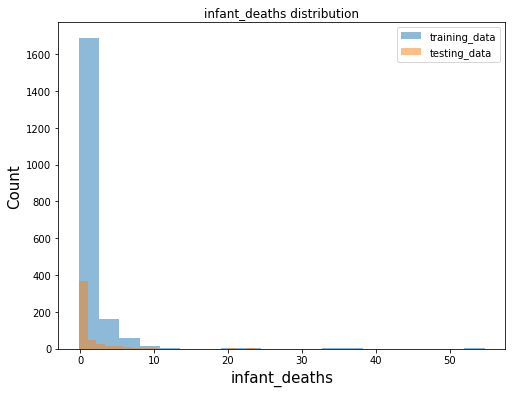

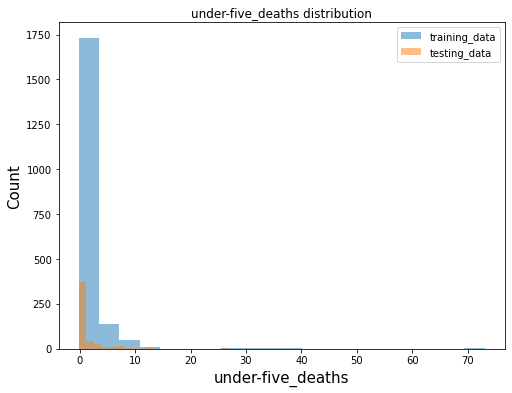

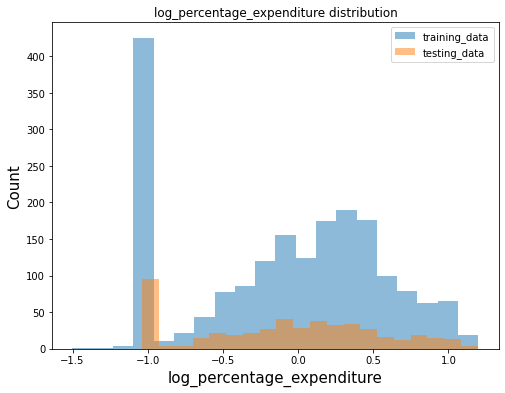

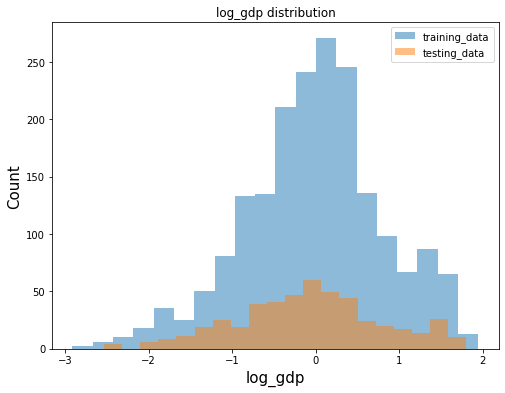

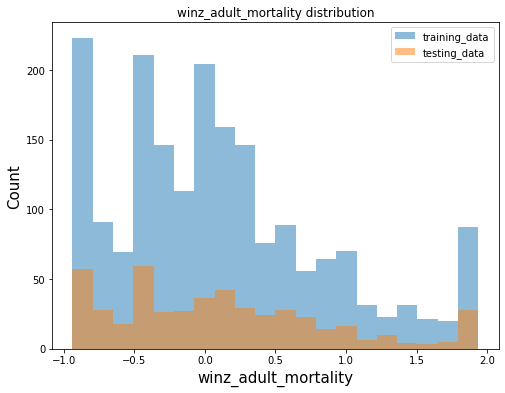

...

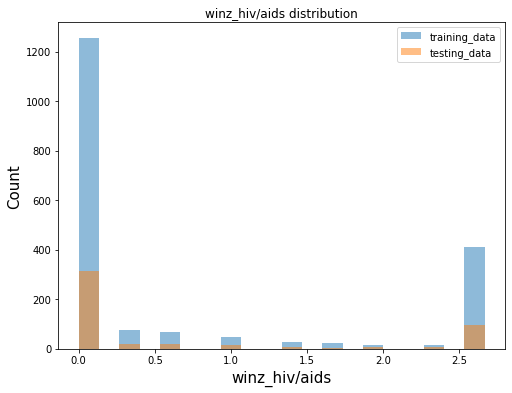

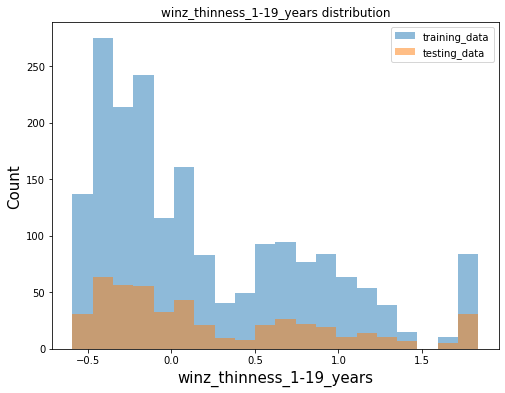

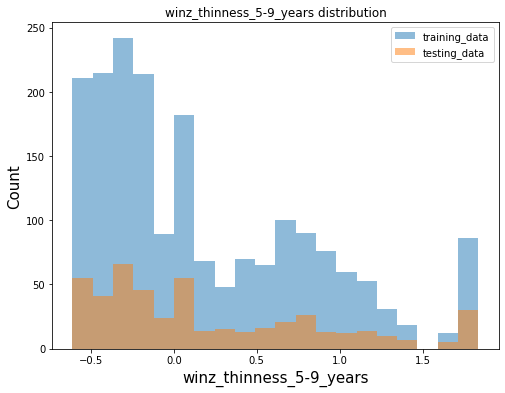

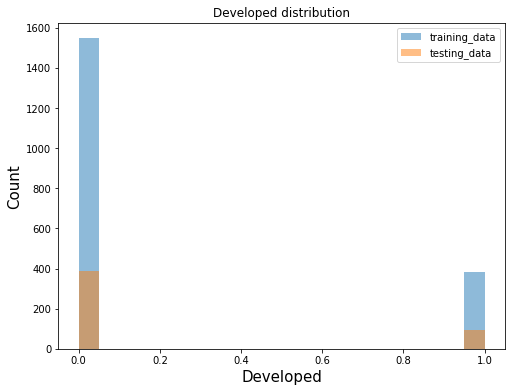

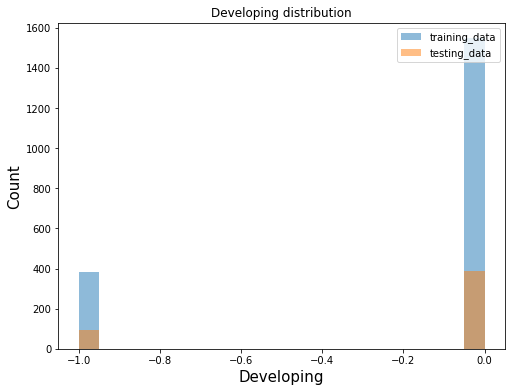

In [67]:
#Training and test data Comparison
for columns in list(X_train.columns):
  plt.figure(figsize=(8,6))
  plt.hist(X_train[columns], bins=20, alpha=0.5, label='training_data')
  plt.hist(X_test[columns], bins=20, alpha=0.5, label='testing_data')
  plt.xlabel(columns, size=15)
  plt.ylabel("Count", size=15)
  plt.title(f'{columns} distribution')
  plt.legend(loc="upper right")
  plt.show()
  

**7. In the predictor variables independent of all the other predictor variables?**

> No,Through the visualizations from the heatmap and pairplot, we see that independant variables are not independent of each other. They exhibit multi-collinearity.



**8. Which predictor variables are the most important?**


> The following independent variables are useful:

*   winz_hiv/aids

*   winz_income_composition_of_resources

*   winz_adult_mortality

*   winz_thinness_5-9_years


*   winz_thinness_1-19_years

*   winz_schooling

*   under-five_deaths

*   winz_hepatitis_b 

*   winz_polio
*   Developed

*   log_percentage_expenditure 

*   Developing

*   log_gdp
*   winz_total_expenditure


























**9. Do the ranges of the predictor variables make sense?**


> From the above visualizations we can infer the following:



> **BOXPLOT**


*   **infant_deaths, measles, under-five_deaths, log_population, log_gdp** have outliers which means that the abnormalities grew higher than expected.

*   Features such as **winz_adult_mortality, winz_alcohol, winz_total_expenditure, winz_schooling** appear to be symmetric through the boxplot.

*   Features such as **winz_diptheria, winz_polio, winz_thinness** appear to be skewed



> **HEATMAP**


*   We see a lot of correlation between the vraiables/features through the heatmap.

*   Life expectancy has the highest positive correlation with **income_composition_of_resources** followed by **schooling**, with the coefficient values being **0.79, 0.76**. From this we can infer that as these features increase we see the life_expectancy also to increase.

*   Life expectancy has the  negative correlation with **adult_mortality**  with the coefficient values being **-0.71**. From this we can infer that as adult_mortality decreases we see the life_expectancy  to increase.


> **PAIR PLOT**

*   In the pair plot, we see that **income_composition_of_resources** and **schooling** have a high positive correlation, which means as the income and availability of a country increases it leads to increase in the schooling of the children.

*   In the pair plot, we see that **percentage_expenditure** and **gdp** have a high positive correlation, which means as the gdp of a country increases it leads to increase in the percentage_expenditure of the country.




**10. What are the distributions of the predictor variables?**



> **Q-Q PLOT**


*   From the above Q-Q Plot, we can see that almost all the independent variables/features are roughly following normal distribution

*  There are few outliers which can be further scaled by using one of the following methods


*   StandardScaler
*   MinMaxScaler
*   RobustScaler
*   Normalizer


*   We will be using RobustScaler to normalize our dataset furthermore.

> **HISTOGRAM HISTOGRAM**

*   From the above Histogram Plot, we can see that almost all the independent variables/features are roughly following normal distribution.

*   Some are right-skewed like the distribution for polio





**11.Remove outliers and keep outliers (does if have an effect of the final predictive model)?**

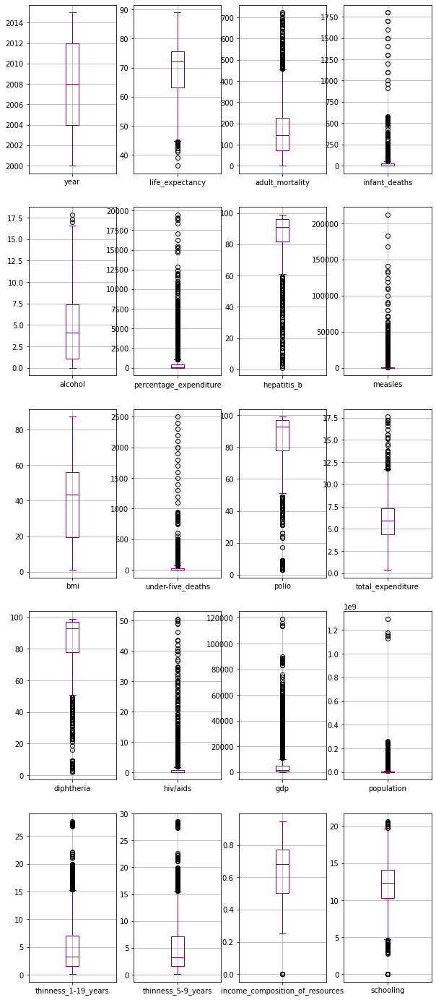

In [68]:
#DATASET WITH OUTLIERS
df_original_impt

#Analysing the variables/features through boxplot to visualize the outliers in our dataset

df_outlier = df_original_impt.copy()
plt.figure(figsize=(10,30))
numeric_columns = list(df_outlier.columns)
numeric_columns.remove("country")
numeric_columns.remove("status")

for i, column in enumerate((numeric_columns), start=1):
  plt.subplot(6,4,i)
  df_outlier.boxplot(column, color="purple")

In [69]:
df_outlier.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          2938 non-null   object 
 1   year                             2938 non-null   int64  
 2   status                           2938 non-null   object 
 3   life_expectancy                  2938 non-null   float64
 4   adult_mortality                  2938 non-null   float64
 5   infant_deaths                    2938 non-null   int64  
 6   alcohol                          2938 non-null   float64
 7   percentage_expenditure           2938 non-null   float64
 8   hepatitis_b                      2938 non-null   float64
 9   measles                          2938 non-null   int64  
 10  bmi                              2938 non-null   float64
 11  under-five_deaths                2938 non-null   int64  
 12  polio               

**ONE-HOT ENCODING**

In [70]:
from sklearn.model_selection import train_test_split

#Removing the insignificant features before modeling
insignificang_features = ['measles','population','alcohol','country','year','bmi']

df_outlier_train = df_outlier.copy()
df_outlier_train.drop(insignificang_features, axis=1, inplace=True)



# One-hot encoding a single column
from sklearn.preprocessing import OneHotEncoder

ohe = OneHotEncoder()
trans = ohe.fit_transform(df_outlier_train[['status']])

# Getting one hot encoded categories
print(ohe.categories_)

df_outlier_train[ohe.categories_[0]] = trans.toarray()
df_outlier_train.head()
df_outlier_train.drop(['status'], axis=1, inplace=True)
df_outlier_train.info()
df_outlier_train.head()

[array(['Developed', 'Developing'], dtype=object)]
<class 'pandas.core.frame.DataFrame'>
Int64Index: 2938 entries, 0 to 2937
Data columns (total 17 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   life_expectancy                  2938 non-null   float64
 1   adult_mortality                  2938 non-null   float64
 2   infant_deaths                    2938 non-null   int64  
 3   percentage_expenditure           2938 non-null   float64
 4   hepatitis_b                      2938 non-null   float64
 5   under-five_deaths                2938 non-null   int64  
 6   polio                            2938 non-null   float64
 7   total_expenditure                2938 non-null   float64
 8   diphtheria                       2938 non-null   float64
 9   hiv/aids                         2938 non-null   float64
 10  gdp                              2938 non-null   float64
 11  thinness_1-19_years            

,life_expectancy,adult_mortality,infant_deaths,percentage_expenditure,hepatitis_b,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling,Developed,Developing
0,65.0,263.0,62,71.279624,65.0,83,6.0,8.16,65.0,0.1,584.259210,17.2,17.3,0.479,10.1,0.0,1.0
16,77.8,74.0,0,364.975229,99.0,0,99.0,6.00,99.0,0.1,3954.227830,1.2,1.3,0.762,14.2,0.0,1.0
32,75.6,19.0,21,0.000000,95.0,24,95.0,7.08,95.0,0.1,4132.762920,6.0,5.8,0.743,14.4,0.0,1.0
48,52.4,335.0,66,0.000000,64.0,98,7.0,7.08,64.0,1.9,3695.793748,8.3,8.2,0.531,11.4,0.0,1.0
64,76.4,13.0,0,0.000000,99.0,0,86.0,7.08,99.0,0.2,13566.954100,3.3,3.3,0.784,13.9,0.0,1.0


**MODEL BUILDING WITH OUTLIERS**

In [71]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error 
from sklearn import datasets, linear_model


model_outlier = LinearRegression()
model_no_outlier = LinearRegression()


In [72]:


df = df_outlier_train.drop(['life_expectancy'], axis=1)
columns = list(df.columns)
X = df_outlier_train[columns]
y = df_outlier_train['life_expectancy']


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=1)

model_outlier.fit(X_train, y_train)

LinearRegression()

In [73]:
X_train.head()

,adult_mortality,infant_deaths,percentage_expenditure,hepatitis_b,under-five_deaths,polio,total_expenditure,diphtheria,hiv/aids,gdp,thinness_1-19_years,thinness_5-9_years,income_composition_of_resources,schooling,Developed,Developing
1865,147.0,3,321.613259,98.0,3,99.0,6.39,98.0,0.1,1682.957924,1.8,1.8,0.620,11.5,0.0,1.0
2812,117.0,0,482.803945,94.0,0,94.0,8.68,94.0,0.1,16881.256800,1.5,1.4,0.788,15.5,0.0,1.0
1789,22.0,61,4.632776,75.0,83,82.0,1.78,82.0,0.6,296.972840,13.2,13.5,0.474,8.0,0.0,1.0
1779,43.0,93,47.172507,89.0,136,69.0,6.16,7.0,12.2,277.648659,4.2,4.1,0.291,5.4,0.0,1.0
765,325.0,2,94.133029,86.0,2,68.0,6.22,68.0,4.2,819.974118,6.1,5.9,0.378,3.5,0.0,1.0


**MODEL BUILDING WITHOUT OUTLIERS**

In [74]:
from sklearn.model_selection import train_test_split

insignificang_features = ['measles','log_population','winz_alcohol']
df_model_original = df_normalized_final.copy()

#Removing the insignificant features before modeling
df_model_original.drop(insignificang_features, axis=1, inplace=True)
#df_model_original.info()
df = df_model_original.drop(['winz_life_expectancy'], axis=1)
columns = list(df.columns)
X1 = df_model_original[columns]
y1 = df_model_original['winz_life_expectancy']


X_train1, X_test1, y_train1, y_test1 = train_test_split(X1, y1, test_size = 0.3, random_state=1)
model_no_outlier.fit(X_train1, y_train1)

LinearRegression()

**TEST AND EVALUATION**

**WITH OUTLIERS**

In [75]:
#PREDICTION ON THE TRAINING SET
#EVALUATE THE MODEL

y_predictions = model_outlier.predict(X_test)

from sklearn import metrics

print('Mean Absolute Error [MAE]: ', round(metrics.mean_absolute_error(y_test,y_predictions),2))
print('Mean Square Error [MSE]: ', round(metrics.mean_squared_error(y_test, y_predictions),2))
print('Root mean Square Error [RMSE]: ', round(np.sqrt(metrics.mean_squared_error(y_test, y_predictions)),3))
print('\nCoefficient of Determination :', round(r2_score(y_test,y_predictions)))

r2 = r2_score(y_test,y_predictions)
print('R^2 score on testing set =',r2)

Mean Absolute Error [MAE]:  3.02
Mean Square Error [MSE]:  16.5
Root mean Square Error [RMSE]:  4.062

Coefficient of Determination : 1
R^2 score on testing set = 0.8061939160365815


**WITHOUT OUTLIERS**

In [76]:
#PREDICTION ON THE TRAINING SET
#EVALUATE THE MODEL

y_predictions1 = model_no_outlier.predict(X_test1)

from sklearn import metrics

print('Mean Absolute Error [MAE]: ', round(metrics.mean_absolute_error(y_test1,y_predictions1),2))
print('Mean Square Error [MSE]: ', round(metrics.mean_squared_error(y_test1, y_predictions1),2))
print('Root mean Square Error [RMSE]: ', round(np.sqrt(metrics.mean_squared_error(y_test1, y_predictions1)),3))
print('\nCoefficient of Determination :', round(r2_score(y_test1,y_predictions1)))

r2 = r2_score(y_test1,y_predictions1)
print('R^2 score on testing set =',r2)

Mean Absolute Error [MAE]:  0.25
Mean Square Error [MSE]:  0.11
Root mean Square Error [RMSE]:  0.325

Coefficient of Determination : 1
R^2 score on testing set = 0.8372565558534919


**INFERENCE**

> We see a signifant decrease in the root mean square of the model predicted  without the outliers.

> With outliers --> RMSE --> **4.06**

> Without outliers --> RMSE --> **0.325**







**12. Remove 1%, 5%, and 10% of your data randomly and impute the values back using at least 3 imputation methods. How well did the methods recover the missing values?  That is remove some data, check the % error on residuals for numeric data and check for bias and variance of the error.**

### **FUNCTIONS**

**COMPONENTS OF PREDICTIVE ERRORS**


> **Bias:** Difference between the prediction of the true model and the average models (models build on n number of samples obtained from the population).


> **Variance:** Difference between the prediction of all the models obtained from the sample with the average model.



> **Noise:** It is the irreducible error that a model cannot predict.


**REFERENCES**


*   https://www.analyticsvidhya.com/blog/2020/12/a-measure-of-bias-and-variance-an-experiment/
*   https://towardsdatascience.com/simple-mathematical-derivation-of-bias-variance-error-4ab223f28791


*   https://www.bmc.com/blogs/bias-variance-machine-learning/

*   https://medium.com/analytics-vidhya/calculation-of-bias-variance-in-python-8f96463c8942












**MEAN SQUARE ERROR, VARIANCE OF RESIDUALS**


---



---



> **RESIDUAL**


> A residual is the difference between an observed value and a predicted value in a regression model.


> **Residual** = Observed value – Predicted value


---



> **MEAN SQUARE ERROR**

> **Mean squared error** is calculated by squaring the residual errors of each data point, summing the squared errors, and dividing the sum by the total number of data points.

> 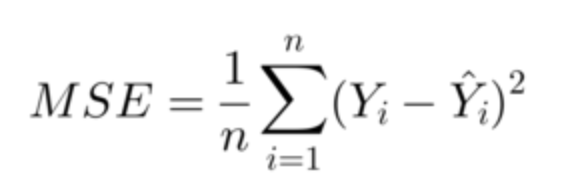




> **REFERENCES**


> https://study.com/learn/lesson/mean-squared-error-formula.html










---








>**RESIDUAL VARIANCE** 



> In a **regression model**, the residual variance is defined as the sum of squared differences between predicted data points and observed data points.




> It is calculated as:


> **Σ(ŷi – yi)2**


---
> **REFERENCES**

> https://www.statology.org/how-to-interpret-residual-standard-error/









**Function 1 : get_percent_missing**

> This function is used to find the percentage of null values in the respective cilumns






In [77]:
#get percentage of missing null values
def get_percent_missing(dataframe):
    
    percent_missing = round(dataframe.isnull().sum() * 100 / len(dataframe),2)
    missing_value_df = pd.DataFrame({'column_name': dataframe.columns,
                                     'percent_missing': percent_missing})
    return missing_value_df

**Function 2 : fill_na**

> This function is used to fill **1%, 5%, 10%** null values in the respective columns



In [78]:
#function to add Nan/ null values
def fill_na(df,feature):
  print(feature)
  df_impute = pd.DataFrame(df[f'{feature}'])
 
  df_impute[f'{feature}_percent_1'] = df[f'{feature}']
  df_impute[f'{feature}_percent_5'] = df[f'{feature}']
  df_impute[f'{feature}_percent_10'] = df[f'{feature}']
  display(df_impute)  
  
  #NULL VALUES BEFORE ADDING NaN
  print("PERCENTAGE OF NULL VALUES BEFORE ADDING Nan\n")
  df = get_percent_missing(df_impute)
  display(df)

  #ADDING 1 % Nan VALUES TO THE COLUMNS
  df_impute.loc[df_impute.sample(frac=0.01).index, f'{feature}_percent_1'] = pd.np.nan

  #ADDING 5 % Nan VALUES TO THE COLUMNS
  df_impute.loc[df_impute.sample(frac=0.05).index, f'{feature}_percent_5'] = pd.np.nan

  #ADDING 10 % Nan VALUES TO THE COLUMNS
  df_impute.loc[df_impute.sample(frac=0.1).index, f'{feature}_percent_10'] = pd.np.nan

  #NULL VALUES AFTER ADDING 1%, 5%, 10% NaN 
  print("PERCENTAGE OF NULL VALUES AFTER ADDING Nan\n")
  df1 = get_percent_missing(df_impute)
  display(df1)

  return df_impute






**Function 2 : impute_values**

> This function is used to perform imputation for the null values present in the respective columns


> Types of imputation used:


*   **MEAN**

      Mean imputation (MI) is one such method in which the mean of the observed values for each variable is computed and the missing values for that variable are imputed by this mean.


*   **MEDIAN**

     replacing all occurrences of missing values (NA) within a variable by the mean (if the variable has a Gaussian distribution) or median (if the variable has a skewed distribution).



*  **MOST FREQUENT**

    This technique says to replace the missing value with the variable with the highest frequency or in simple words replacing the values with the Mode of that column. This technique is also referred to as Mode Imputation.








In [79]:
#function for imputation
from sklearn.impute import SimpleImputer

def impute_values(df, impute_method):
  cols = list(df.columns)
  #MEAN
  #cols.remove('winz_life_expectancy')
  if impute_method == 'mean':
    impute_mean = SimpleImputer(strategy=impute_method)
    impute_mean.fit(df)
    df_impute = impute_mean.transform(df)
    df_impute = pd.DataFrame(df_impute, columns = cols)

    # #NULL VALUES AFTER ADDING 1%, 5%, 10% NaN 
    # print("PERCENTAGE OF NULL VALUES BEFORE ADDING Nan\n")
    # df1 = get_percent_missing(df_impute)
    # display(df1)

  #MEDIAN
  #cols.remove('winz_life_expectancy')
  elif impute_method == 'median':
    impute_mean = SimpleImputer(strategy=impute_method)
    impute_mean.fit(df)
    df_impute = impute_mean.transform(df)
    df_impute = pd.DataFrame(df_impute, columns = cols)

  #MOST_FREQUENT
  elif impute_method == 'most_frequent':
    impute_mean = SimpleImputer(strategy=impute_method)
    impute_mean.fit(df)
    df_impute = impute_mean.transform(df)
    df_impute = pd.DataFrame(df_impute, columns = cols)

    
    #NULL VALUES AFTER ADDING 1%, 5%, 10% NaN 
    print("PERCENTAGE OF NULL VALUES BEFORE ADDING Nan\n")
    df1 = get_percent_missing(df_impute)
    display(df1)
    
  return df_impute




**Function 3 : statistical_measures**


> This function is used to calculate the the statistical measures such as **MSE**, **VARIANCE**

> I have used both mathematical formula to verify it with the inbuilt function.





In [80]:
#function for imputation
from sklearn.impute import SimpleImputer
from sklearn.metrics import r2_score, mean_squared_error 
import statistics 

def statistical_measures(df):
  #RESIDUAL/ERROR = EXPECTED VALUE - PREDICTED VALUE
  length = df.shape[0]


  #FINDING MSE FOR 1% IMPUTATION
  df['residual_percent_1'] = df['winz_life_expectancy'] - df['winz_life_expectancy_percent_1']
  df['residual_square_percent_1'] = pow(df['winz_life_expectancy'] - df['winz_life_expectancy_percent_1'],2)
  df['residual_percentage_error_1'] = ((df['winz_life_expectancy'] - df['winz_life_expectancy_percent_1'])/df['winz_life_expectancy'])*100
  residual_mean = df['residual_percent_1'].mean()

  print("\n=======================================================================================================")
  print("1% IMPUTATION")
  print("=======================================================================================================")
  print("\nMEAN SQUARE ERROR - MSE")
  print("-----------------------------------------------------------------------------")

  #FINDING MSE USING THE MATHEMATICAL FORMULA FOR 1% IMPUTATION
  mse_formula = (pow((df['winz_life_expectancy'] - df['winz_life_expectancy_percent_1']),2)).sum()/length
  print("MSE USING MATHEMATICAL FORMULA --> ", mse_formula )

  #FINDING MSE USING THE SCIKIT INBUILT FORMULA FOR 1% IMPUTATION
  mse = mean_squared_error(df['winz_life_expectancy'] , df['winz_life_expectancy_percent_1'])
  print("MSE USING SCIKIT FUNCTION --> ", mse )

  print("\nVARIANCE")
  print("-----------------------------------------------------------------------------")
  print("Mean value of the residuals --> ", residual_mean)
  
  #FINDING VARIANCE USING THE MATHEMATICAL FORMULA FOR 1% IMPUTATION
  var_formula = round((pow((df['residual_percent_1'] - residual_mean),2)).sum()/length,5)
  print("\nVARIANCE USING MATHEMATICAL FORMULA --> ", var_formula )

  #FINDING VARIANCE USING THE SCIKIT INBUILT FORMULA FOR 1% IMPUTATION
  var = round(statistics.variance(list(df['residual_percent_1'])),5)
  print("VARIANCE USING SCIKIT FUNCTION --> ", var)

  #FINDING MSE FOR 5% IMPUTATION
  df['residual_percent_5'] = df['winz_life_expectancy'] - df['winz_life_expectancy_percent_5']
  df['residual_square_percent_5'] = pow(df['winz_life_expectancy'] - df['winz_life_expectancy_percent_5'],2)
  df['residual_percentage_error_5'] = ((df['winz_life_expectancy'] - df['winz_life_expectancy_percent_5'])/df['winz_life_expectancy'])*100
  residual_mean_5 = df['residual_percent_5'].mean()

  print("\n=======================================================================================================")
  print("5% IMPUTATION")
  print("=======================================================================================================")
  print("\nMEAN SQUARE ERROR - MSE")
  print("-----------------------------------------------------------------------------")

  #FINDING MSE USING THE MATHEMATICAL FORMULA FOR 5% IMPUTATION
  mse_formula = (pow((df['winz_life_expectancy'] - df['winz_life_expectancy_percent_5']),2)).sum()/length
  print("MSE USING MATHEMATICAL FORMULA --> ", mse_formula )

  #FINDING MSE USING THE SCIKIT INBUILT FORMULA FOR 5% IMPUTATION
  mse = mean_squared_error(df['winz_life_expectancy'] , df['winz_life_expectancy_percent_5'])
  print("MSE USING SCIKIT FUNCTION --> ", mse )

  print("\nVARIANCE")
  print("-----------------------------------------------------------------------------")
  print("Mean value of the residuals --> ", residual_mean_5)
  
  #FINDING VARIANCE USING THE MATHEMATICAL FORMULA FOR 5% IMPUTATION
  var_formula = round((pow((df['residual_percent_5'] - residual_mean_5),2)).sum()/length,5)
  print("\nVARIANCE USING MATHEMATICAL FORMULA --> ", var_formula )

  #FINDING VARIANCE USING THE SCIKIT INBUILT FORMULA FOR 5% IMPUTATION
  var = round(statistics.variance(list(df['residual_percent_5'])),5)
  print("VARIANCE USING SCIKIT FUNCTION --> ", var)
  

  #FINDING MSE FOR 10% IMPUTATION
  df['residual_percent_10'] = df['winz_life_expectancy'] - df['winz_life_expectancy_percent_10']
  df['residual_square_percent_10'] = pow(df['winz_life_expectancy'] - df['winz_life_expectancy_percent_10'],2)
  df['residual_percentage_error_10'] = ((df['winz_life_expectancy'] - df['winz_life_expectancy_percent_1'])/df['winz_life_expectancy'])*100
  residual_mean_10 = df['residual_percent_10'].mean()

  print("\n=======================================================================================================")
  print("10% IMPUTATION")
  print("=======================================================================================================")
  print("\nMEAN SQUARE ERROR - MSE")
  print("-----------------------------------------------------------------------------")
  

  #FINDING MSE USING THE MATHEMATICAL FORMULA FOR 10% IMPUTATION
  mse_formula = (pow((df['winz_life_expectancy'] - df['winz_life_expectancy_percent_10']),2)).sum()/length
  print("MSE USING MATHEMATICAL FORMULA --> ", mse_formula )

  #FINDING MSE USING THE SCIKIT INBUILT FORMULA FOR 10% IMPUTATION
  mse = mean_squared_error(df['winz_life_expectancy'] , df['winz_life_expectancy_percent_10'])
  print("MSE USING SCIKIT FUNCTION --> ", mse )

  print("\nVARIANCE")
  print("-----------------------------------------------------------------------------")
  print("Mean value of the residuals --> ", residual_mean_10)
  
  #FINDING VARIANCE USING THE MATHEMATICAL FORMULA FOR 10% IMPUTATION
  var_formula = round((pow((df['residual_percent_10'] - residual_mean_10),2)).sum()/length,4)
  print("\nVARIANCE USING MATHEMATICAL FORMULA --> ", var_formula )

  #FINDING VARIANCE USING THE SCIKIT INBUILT FORMULA FOR 10% IMPUTATION
  var = round(statistics.variance(list(df['residual_percent_10'])),4)
  print("VARIANCE USING SCIKIT FUNCTION --> ", var)
  

  return df

In [81]:
def calc_residual(df):
  df['residual_error'] =  df['life_expectancy'] - df[f'{col}']
  df['residuals_square'] = round(pow(df['residuals'] ,2),3)

  #SCATTER PLOT OF THE REAL VALUES VERSUS THE IMPUTED VALUES
  print("SCATTER PLOT OF THE REAL VALUES VERSUS THE IMPUTED VALUES")
  plt.scatter(df['life_expectancy'] , df[f'{col}'])
  plt.xlabel('life_expectancy [True Values]')
  plt.ylabel('life_expectancy Imputed Values')

  #RESIDUALS
  #RESIDUAL PLOT OF THE REAL VALUES VERSUS THE IMPUTED VALUES
  sns.distplot((df['life_expectancy']-df[f'{col}']), bins=50, color='purple')


  residual_variance = df['residuals_square'].sum()
  return df,residual_variance

**Function 4 : residual_plot**

> This function plots the residuals for all the imputation methods accross all 1%, 5% and 10% null values



In [82]:
from jinja2.filters import do_default
#SCATTER PLOT OF THE REAL TEST VALUES VERSUS THE PREDICTED VALUES

def residual_plot(df):
  plt.figure(figsize=(20,40))
  print("RESIDUAL PLOT FOR 1% IMPUTATION")
  plt.subplot(3,3,1)
  plt.scatter(df['winz_life_expectancy'], df['winz_life_expectancy_percent_1'])
  plt.xlabel('True Feature Values')
  plt.ylabel('Imputed Feature Values')

  p1 = max(max(df['winz_life_expectancy_percent_1']), max(df['winz_life_expectancy']))
  p2 = min(min(df['winz_life_expectancy_percent_1']), min(df['winz_life_expectancy']))
  plt.plot([p1, p2], [p1, p2], 'r-')

  plt.subplot(3,3,2)
  plt.scatter(df['winz_life_expectancy']-df['winz_life_expectancy_percent_1'],df['winz_life_expectancy_percent_1'], color="teal")
  plt.xlabel('Predicted Value')
  plt.ylabel('Residual Error')
  plt.title('PLOT FOR 1 % MEAN IMPUTATION ', fontsize = 16)

  plt.subplot(3,3,3)
  plt.hist(df['winz_life_expectancy']-df['winz_life_expectancy_percent_1'],bins=50, color = 'orange')
  plt.xlabel('Distribution Of Error')
  #plt.ylabel('Residual Error')

  print("RESIDUAL PLOT FOR 5% IMPUTATION")
  plt.subplot(3,3,4)
  plt.scatter(df['winz_life_expectancy'], df['winz_life_expectancy_percent_5'])
  plt.xlabel('True Feature Values')
  plt.ylabel('Imputed Feature Values')

  p1 = max(max(df['winz_life_expectancy_percent_5']), max(df['winz_life_expectancy']))
  p2 = min(min(df['winz_life_expectancy_percent_5']), min(df['winz_life_expectancy']))
  plt.plot([p1, p2], [p1, p2], 'r-')

  plt.subplot(3,3,5)
  plt.scatter(df['winz_life_expectancy']-df['winz_life_expectancy_percent_5'],df['winz_life_expectancy_percent_5'], color="teal")
  plt.xlabel('Predicted Value')
  plt.ylabel('Residual Error')
  plt.title('PLOT FOR 5 % MEAN IMPUTATION ', fontsize = 16)

  plt.subplot(3,3,6)
  plt.hist(df['winz_life_expectancy']-df['winz_life_expectancy_percent_5'],bins=50, color = 'orange')
  plt.xlabel('Distribution Of Error')
  #plt.ylabel('Residual Error')

  print("RESIDUAL PLOT FOR 10% IMPUTATION")
  plt.subplot(3,3,7)
  plt.scatter(df['winz_life_expectancy'], df['winz_life_expectancy_percent_10'])
  plt.xlabel('True Feature Values')
  plt.ylabel('Imputed Feature Values')

  p1 = max(max(df['winz_life_expectancy_percent_10']), max(df['winz_life_expectancy']))
  p2 = min(min(df['winz_life_expectancy_percent_10']), min(df['winz_life_expectancy']))
  plt.plot([p1, p2], [p1, p2], 'r-')

  plt.subplot(3,3,8)
  plt.scatter(df['winz_life_expectancy']-df['winz_life_expectancy_percent_10'],df['winz_life_expectancy_percent_10'], color="teal")
  plt.xlabel('Predicted Value')
  plt.ylabel('Residual Error')
  plt.title('PLOT FOR 10 % MEAN IMPUTATION ', fontsize = 16)

  plt.subplot(3,3,9)
  plt.hist(df['winz_life_expectancy']-df['winz_life_expectancy_percent_10'],bins=50, color = 'orange')
  plt.xlabel('Distribution Of Error')


#RESIDUALS
#plt.subplot(3,2,2)
#sns.displot((df['winz_life_expectancy']-df['winz_life_expectancy_percent_1']),kde=True, color='purple')

In [83]:
#NORMALIZED DATAFRAME
df_model_impute=df_normalized_final.copy()

In [84]:
#FEATURE SELECTION
feature = 'winz_life_expectancy'

Generating Null values using the **fill_na** functions as defined above

In [85]:
df_fill_na = fill_na(df_model_impute, feature)

winz_life_expectancy


,winz_life_expectancy,winz_life_expectancy_percent_1,winz_life_expectancy_percent_5,winz_life_expectancy_percent_10
0,0.444444,0.444444,0.444444,0.444444
1,0.240741,0.240741,0.240741,0.240741
2,-1.888889,-1.888889,-1.888889,-1.888889
3,0.314815,0.314815,0.314815,0.314815
4,0.305556,0.305556,0.305556,0.305556
...,...,...,...,...
2408,0.194444,0.194444,0.194444,0.194444
2409,-0.546296,-0.546296,-0.546296,-0.546296
2410,-0.370370,-0.370370,-0.370370,-0.370370
2411,-0.046296,-0.046296,-0.046296,-0.046296


PERCENTAGE OF NULL VALUES BEFORE ADDING Nan



,column_name,percent_missing
winz_life_expectancy,winz_life_expectancy,0.0
winz_life_expectancy_percent_1,winz_life_expectancy_percent_1,0.0
winz_life_expectancy_percent_5,winz_life_expectancy_percent_5,0.0
winz_life_expectancy_percent_10,winz_life_expectancy_percent_10,0.0


PERCENTAGE OF NULL VALUES AFTER ADDING Nan



<ipython-input-78-33ca47665f5e>:17: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  df_impute.loc[df_impute.sample(frac=0.01).index, f'{feature}_percent_1'] = pd.np.nan
<ipython-input-78-33ca47665f5e>:20: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  df_impute.loc[df_impute.sample(frac=0.05).index, f'{feature}_percent_5'] = pd.np.nan
<ipython-input-78-33ca47665f5e>:23: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead
  df_impute.loc[df_impute.sample(frac=0.1).index, f'{feature}_percent_10'] = pd.np.nan


,column_name,percent_missing
winz_life_expectancy,winz_life_expectancy,0.00
winz_life_expectancy_percent_1,winz_life_expectancy_percent_1,0.99
winz_life_expectancy_percent_5,winz_life_expectancy_percent_5,5.01
winz_life_expectancy_percent_10,winz_life_expectancy_percent_10,9.99


**OBSERVATION**

---


*   Using the **fill_na** function which has been defined above, we have created 3 columns **winz_life_expectancy_percent_1, winz_life_expectancy_percent_5, winz_life_expectancy_percent_10** consisting of 1%, 5% and 10% Nan values respectively

*   We can see two tables


> *  table 1 : consisting of no null values
> *  table 2 : consisting of **1%, 5%, 10%** null values 

---









df after adding **1%, 5%, 10%** Nan values in **winz_life_expectancy_percent_1, winz_life_expectancy_percent_5, winz_life_expectancy_percent_10** columns respectively

In [86]:
#df after adding Nan values
df_fill_na

,winz_life_expectancy,winz_life_expectancy_percent_1,winz_life_expectancy_percent_5,winz_life_expectancy_percent_10
0,0.444444,0.444444,0.444444,0.444444
1,0.240741,0.240741,0.240741,NaN
2,-1.888889,-1.888889,-1.888889,-1.888889
3,0.314815,0.314815,0.314815,0.314815
4,0.305556,0.305556,0.305556,0.305556
...,...,...,...,...
2408,0.194444,0.194444,0.194444,0.194444
2409,-0.546296,-0.546296,-0.546296,-0.546296
2410,-0.370370,-0.370370,-0.370370,-0.370370
2411,-0.046296,-0.046296,-0.046296,-0.046296


**IMPUTATION METHOD - MEAN**

Filling the Nan values with the **MEAN** imputation

In [87]:
df_impute_mean = impute_values(df_fill_na, 'mean')
df_impute_mean.head()

,winz_life_expectancy,winz_life_expectancy_percent_1,winz_life_expectancy_percent_5,winz_life_expectancy_percent_10
0,0.444444,0.444444,0.444444,0.444444
1,0.240741,0.240741,0.240741,-0.199965
2,-1.888889,-1.888889,-1.888889,-1.888889
3,0.314815,0.314815,0.314815,0.314815
4,0.305556,0.305556,0.305556,0.305556


In [88]:
df_mean_stats = statistical_measures(df_impute_mean)


1% IMPUTATION

MEAN SQUARE ERROR - MSE
-----------------------------------------------------------------------------
MSE USING MATHEMATICAL FORMULA -->  0.0046473658266432405
MSE USING SCIKIT FUNCTION -->  0.0046473658266432405

VARIANCE
-----------------------------------------------------------------------------
Mean value of the residuals -->  0.0005595077678290948

VARIANCE USING MATHEMATICAL FORMULA -->  0.00465
VARIANCE USING SCIKIT FUNCTION -->  0.00465

5% IMPUTATION

MEAN SQUARE ERROR - MSE
-----------------------------------------------------------------------------
MSE USING MATHEMATICAL FORMULA -->  0.03283551307195327
MSE USING SCIKIT FUNCTION -->  0.03283551307195327

VARIANCE
-----------------------------------------------------------------------------
Mean value of the residuals -->  0.0049069505548969975

VARIANCE USING MATHEMATICAL FORMULA -->  0.03281
VARIANCE USING SCIKIT FUNCTION -->  0.03283

10% IMPUTATION

MEAN SQUARE ERROR - MSE
-------------------------------

**INFERENCE**

> We see that the MSE 1% of  MEAN imputation is the least, the value being --> **0.006**



In [89]:
df_mean_stats

,winz_life_expectancy,winz_life_expectancy_percent_1,winz_life_expectancy_percent_5,winz_life_expectancy_percent_10,residual_percent_1,residual_square_percent_1,residual_percentage_error_1,residual_percent_5,residual_square_percent_5,residual_percentage_error_5,residual_percent_10,residual_square_percent_10,residual_percentage_error_10
0,0.444444,0.444444,0.444444,0.444444,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
1,0.240741,0.240741,0.240741,-0.199965,0.0,0.0,0.0,0.0,0.0,0.0,0.440706,0.194222,0.0
2,-1.888889,-1.888889,-1.888889,-1.888889,0.0,0.0,-0.0,0.0,0.0,-0.0,0.000000,0.000000,-0.0
3,0.314815,0.314815,0.314815,0.314815,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
4,0.305556,0.305556,0.305556,0.305556,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2408,0.194444,0.194444,0.194444,0.194444,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
2409,-0.546296,-0.546296,-0.546296,-0.546296,0.0,0.0,-0.0,0.0,0.0,-0.0,0.000000,0.000000,-0.0
2410,-0.370370,-0.370370,-0.370370,-0.370370,0.0,0.0,-0.0,0.0,0.0,-0.0,0.000000,0.000000,-0.0
2411,-0.046296,-0.046296,-0.046296,-0.046296,0.0,0.0,-0.0,0.0,0.0,-0.0,0.000000,0.000000,-0.0


**RESIDUAL PLOT FOR 1%, 5% AND 10% MEAN IMPUTATION**

---




RESIDUAL PLOT FOR 1% IMPUTATION
RESIDUAL PLOT FOR 5% IMPUTATION
RESIDUAL PLOT FOR 10% IMPUTATION


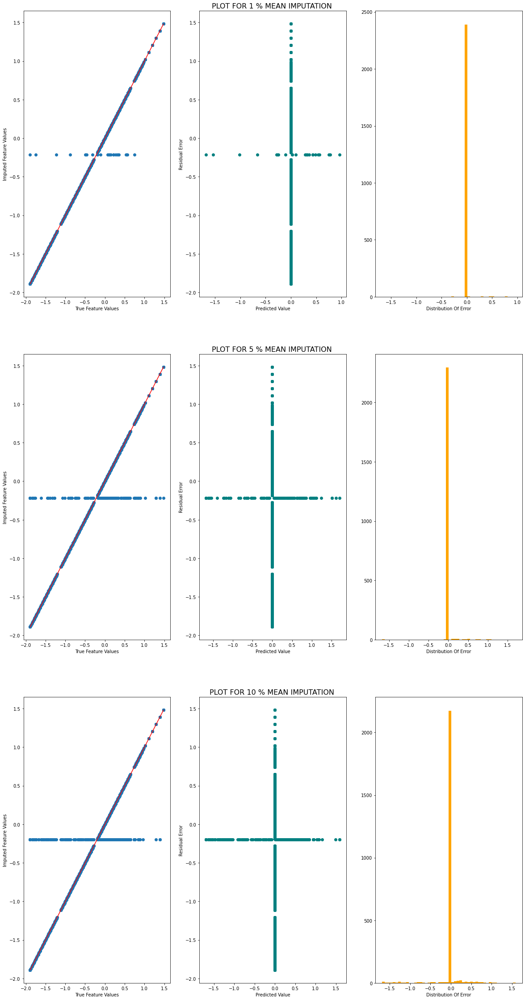

In [90]:
residual_plot(df_mean_stats)

**INFERENCE**

> We see that the Residual plots of all these graphs tell us that the difference between the actual and the imputed value is negligible and therefore we can choose this method for imputation for the current dataset.


**IMPUTATION METHOD - MEDIAN**

Filling the Nan values with the **MEDIAN** imputation

In [91]:
df_impute_median = impute_values(df_fill_na, 'median')
df_impute_median.head()

,winz_life_expectancy,winz_life_expectancy_percent_1,winz_life_expectancy_percent_5,winz_life_expectancy_percent_10
0,0.444444,0.444444,0.444444,0.444444
1,0.240741,0.240741,0.240741,0.000000
2,-1.888889,-1.888889,-1.888889,-1.888889
3,0.314815,0.314815,0.314815,0.314815
4,0.305556,0.305556,0.305556,0.305556


In [92]:
df_median_stats = statistical_measures(df_impute_median)



1% IMPUTATION

MEAN SQUARE ERROR - MSE
-----------------------------------------------------------------------------
MSE USING MATHEMATICAL FORMULA -->  0.004857519028445032
MSE USING SCIKIT FUNCTION -->  0.004857519028445032

VARIANCE
-----------------------------------------------------------------------------
Mean value of the residuals -->  -0.001550244815889243

VARIANCE USING MATHEMATICAL FORMULA -->  0.00486
VARIANCE USING SCIKIT FUNCTION -->  0.00486

5% IMPUTATION

MEAN SQUARE ERROR - MSE
-----------------------------------------------------------------------------
MSE USING MATHEMATICAL FORMULA -->  0.03306080404666767
MSE USING SCIKIT FUNCTION -->  0.03306080404666767

VARIANCE
-----------------------------------------------------------------------------
Mean value of the residuals -->  -0.005947721447099815

VARIANCE USING MATHEMATICAL FORMULA -->  0.03303
VARIANCE USING SCIKIT FUNCTION -->  0.03304

10% IMPUTATION

MEAN SQUARE ERROR - MSE
---------------------------------

**INFERENCE**

> We see that the MSE 1% of  MEDIAN imputation is the least, the value being --> **0.0071**



In [93]:
df_mean_stats

,winz_life_expectancy,winz_life_expectancy_percent_1,winz_life_expectancy_percent_5,winz_life_expectancy_percent_10,residual_percent_1,residual_square_percent_1,residual_percentage_error_1,residual_percent_5,residual_square_percent_5,residual_percentage_error_5,residual_percent_10,residual_square_percent_10,residual_percentage_error_10
0,0.444444,0.444444,0.444444,0.444444,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
1,0.240741,0.240741,0.240741,-0.199965,0.0,0.0,0.0,0.0,0.0,0.0,0.440706,0.194222,0.0
2,-1.888889,-1.888889,-1.888889,-1.888889,0.0,0.0,-0.0,0.0,0.0,-0.0,0.000000,0.000000,-0.0
3,0.314815,0.314815,0.314815,0.314815,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
4,0.305556,0.305556,0.305556,0.305556,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2408,0.194444,0.194444,0.194444,0.194444,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0
2409,-0.546296,-0.546296,-0.546296,-0.546296,0.0,0.0,-0.0,0.0,0.0,-0.0,0.000000,0.000000,-0.0
2410,-0.370370,-0.370370,-0.370370,-0.370370,0.0,0.0,-0.0,0.0,0.0,-0.0,0.000000,0.000000,-0.0
2411,-0.046296,-0.046296,-0.046296,-0.046296,0.0,0.0,-0.0,0.0,0.0,-0.0,0.000000,0.000000,-0.0


**RESIDUAL PLOT FOR 1%, 5% AND 10% MEDIAN IMPUTATION**

---


RESIDUAL PLOT FOR 1% IMPUTATION
RESIDUAL PLOT FOR 5% IMPUTATION
RESIDUAL PLOT FOR 10% IMPUTATION


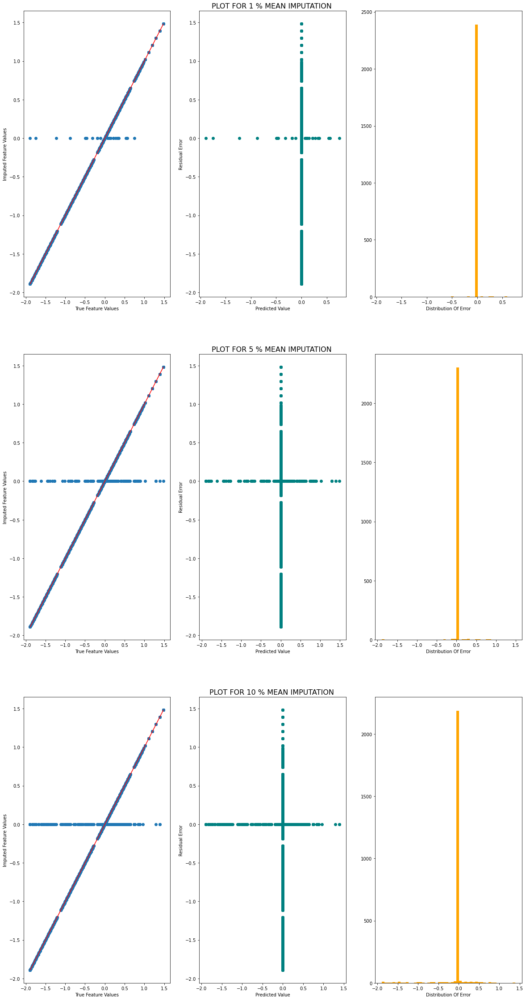

In [94]:
residual_plot(df_median_stats)

**INFERENCE**

> We see that the Residual plots of all these graphs tell us that the difference between the actual and the imputed value is negligible and therefore we can choose this method for imputation for the current dataset.


**IMPUTATION METHOD - MOST FREQUENT**

Filling the Nan values with the **MOST FREQUENT** imputation

In [95]:
df_impute_mf = impute_values(df_fill_na, 'most_frequent')
df_impute_mf.head()

PERCENTAGE OF NULL VALUES BEFORE ADDING Nan



,column_name,percent_missing
winz_life_expectancy,winz_life_expectancy,0.0
winz_life_expectancy_percent_1,winz_life_expectancy_percent_1,0.0
winz_life_expectancy_percent_5,winz_life_expectancy_percent_5,0.0
winz_life_expectancy_percent_10,winz_life_expectancy_percent_10,0.0


,winz_life_expectancy,winz_life_expectancy_percent_1,winz_life_expectancy_percent_5,winz_life_expectancy_percent_10
0,0.444444,0.444444,0.444444,0.444444
1,0.240741,0.240741,0.240741,-1.888889
2,-1.888889,-1.888889,-1.888889,-1.888889
3,0.314815,0.314815,0.314815,0.314815
4,0.305556,0.305556,0.305556,0.305556


In [96]:
df_mf_stats = statistical_measures(df_impute_mf)


1% IMPUTATION

MEAN SQUARE ERROR - MSE
-----------------------------------------------------------------------------
MSE USING MATHEMATICAL FORMULA -->  0.03448783083401126
MSE USING SCIKIT FUNCTION -->  0.03448783083401126

VARIANCE
-----------------------------------------------------------------------------
Mean value of the residuals -->  0.017236880477659595

VARIANCE USING MATHEMATICAL FORMULA -->  0.03419
VARIANCE USING SCIKIT FUNCTION -->  0.0342

5% IMPUTATION

MEAN SQUARE ERROR - MSE
-----------------------------------------------------------------------------
MSE USING MATHEMATICAL FORMULA -->  0.18950421158368858
MSE USING SCIKIT FUNCTION -->  0.18950421158368858

VARIANCE
-----------------------------------------------------------------------------
Mean value of the residuals -->  0.08877070190787557

VARIANCE USING MATHEMATICAL FORMULA -->  0.18162
VARIANCE USING SCIKIT FUNCTION -->  0.1817

10% IMPUTATION

MEAN SQUARE ERROR - MSE
----------------------------------------

**INFERENCE**

> We see that the MSE 1% of  MOST FREQUENCY imputation is the least, the value being --> **0.032**



In [97]:
df_mf_stats

,winz_life_expectancy,winz_life_expectancy_percent_1,winz_life_expectancy_percent_5,winz_life_expectancy_percent_10,residual_percent_1,residual_square_percent_1,residual_percentage_error_1,residual_percent_5,residual_square_percent_5,residual_percentage_error_5,residual_percent_10,residual_square_percent_10,residual_percentage_error_10
0,0.444444,0.444444,0.444444,0.444444,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0
1,0.240741,0.240741,0.240741,-1.888889,0.0,0.0,0.0,0.0,0.0,0.0,2.12963,4.535322,0.0
2,-1.888889,-1.888889,-1.888889,-1.888889,0.0,0.0,-0.0,0.0,0.0,-0.0,0.00000,0.000000,-0.0
3,0.314815,0.314815,0.314815,0.314815,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0
4,0.305556,0.305556,0.305556,0.305556,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2408,0.194444,0.194444,0.194444,0.194444,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.000000,0.0
2409,-0.546296,-0.546296,-0.546296,-0.546296,0.0,0.0,-0.0,0.0,0.0,-0.0,0.00000,0.000000,-0.0
2410,-0.370370,-0.370370,-0.370370,-0.370370,0.0,0.0,-0.0,0.0,0.0,-0.0,0.00000,0.000000,-0.0
2411,-0.046296,-0.046296,-0.046296,-0.046296,0.0,0.0,-0.0,0.0,0.0,-0.0,0.00000,0.000000,-0.0


**RESIDUAL PLOT FOR 1%, 5% AND 10% MEAN IMPUTATION**

---

RESIDUAL PLOT FOR 1% IMPUTATION
RESIDUAL PLOT FOR 5% IMPUTATION
RESIDUAL PLOT FOR 10% IMPUTATION


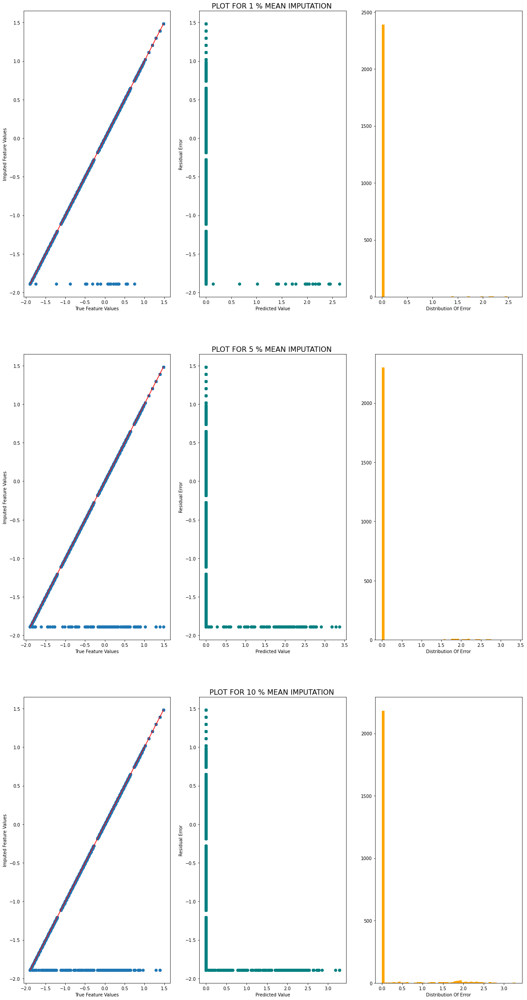

In [98]:

residual_plot(df_mf_stats)

**INFERENCE**

> We see that the Residual plots of all these graphs tell us that the difference between the actual and the imputed value is negligible and therefore we can choose this method for imputation for the current dataset.




---


### **CONCLUSION**

---


*   In the Life Expectancy WHO dataset we have both numerical and categorical data

*   For this Linear Regression analysis we have taken one categorical column status as we are interested in wether the countries are Developed or Developing

*   The dataset consisted of null values for which Imputation methods have been performed and further analysis of the result has been made

*   The dataset also consists of Outliers which have been analysed using boxplot and appropriate methods have been performed to remove majority of the outliers

*   We also performed one hot encoding and various feature selection to otain the statistical measures such as the t-value, p-value

*   As the scale of the features were different, further normalization was performed on the dataset before btraining and testing the model.

*   Post normalization we split the dataset into training and testing and further compared both to make sure that the data across all the features are evenly distributed for the training and the testing dataset


*   We further obtained the statistical measures and obtained the MSE, Variance and percentage error etc.





---
###**REFERENCES**

---


*  Scikit learn Documentation
*  Plotly Documentation
*  Referred Analytics Vidhya Articles
*  Referred Towards Data Science Articles
* Referred Kaggle Notebooks

https://www.kdnuggets.com/2019/07/data-pre-processing-optimizing-regression-model-performance.html

https://quantifyinghealth.com/variables-to-include-in-regression/

https://towardsdatascience.com/understanding-the-ols-method-for-simple-linear-regression-e0a4e8f692cc

https://stackabuse.com/ultimate-guide-to-heatmaps-in-seaborn-with-python/

https://rpubs.com/sabrinapribadi/LinearRegression_LifeExpectancy

https://stats.stackexchange.com/questions/175/how-should-outliers-be-dealt-with-in-linear-regression-analysis

https://www.analyticsvidhya.com/blog/2021/09/q-q-plot-ensure-your-ml-model-is-based-on-the-right-distributions/

https://www.statsimprove.com/en/linear-regression-should-dependent-and-independent-variables-be-distributed-normally/

https://medium.com/swlh/exploratory-data-analysis-what-is-it-and-why-is-it-so-important-part-1-2-240d58a89695

*  Topic specific refernces have been attached throughout the notebook for better understanding. The functions defined for ploting the residual graphs and finding the statistical measures has been written by me. 
*  It is very important to understand the concept and the terms before the impelentation of the same, Therefore I have defined the topic terms before their implementaion so that it would lead to a better understanding.

---








### **Copyright**


> Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:



> The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.



>  THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.










